In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 3.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1178, done.
remote: Counting objects: 100% (244/244), done.
remote: Compressing objects: 100% (141/141), done.
remote: Total 1178 (delta 162), reused 177 (delta 103), pack-reused 934
Receiving objects: 100% (1178/1178), 45.24 MiB | 27.00 MiB/s, done.
Resolving deltas: 100% (824/824), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesSparsity import make_lm_program_Laplace_ig_batched, make_lm_program_Laplace_ig
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/evaluation_PFN_Experiments_CFM_InvGammaLaplace_coupling_LearnedBaseDist_plus_nll_v1"
#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 1.0

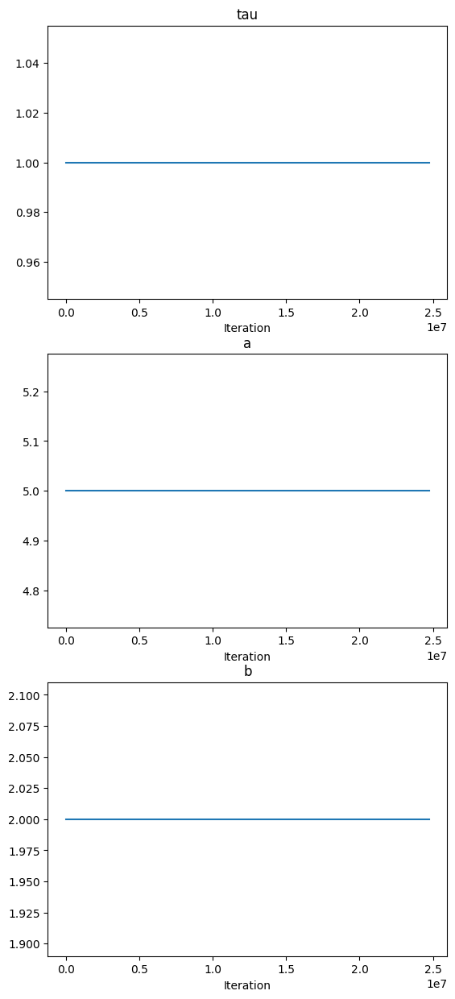

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(99*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_Laplace_ig_batched,
    curriculum= curriculum,
    #coupling = None
)

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 11.65it/s]


{'X': {'mean': tensor(0.5001), 'variance': tensor(0.0832), 'min': tensor(1.3709e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.0021), 'variance': tensor(3.6477), 'min': tensor(-11.7227), 'max': tensor(12.8323)}, 'beta': {'mean': tensor([-0.0010, -0.0021, -0.0209, -0.0126,  0.0390]), 'variance': tensor([2.0039, 1.8554, 1.8385, 2.0390, 1.8827]), 'min': tensor([-7.9849, -6.6373, -6.6975, -9.7521, -7.6508]), 'max': tensor([7.4590, 6.1234, 5.8060, 9.0406, 7.3643])}}
Statistics for sigma_squared:
Mean: tensor([0.5013])
Variance: tensor([0.0919])
Min: tensor([0.1237])
Max: tensor([4.1542])


Statistics for time:
Mean: 0.49240171504206953
Variance: 0.08219311072055402
Min: 0.0006414055824279785
Max: 0.9992914199829102


Statistics for base_sample_beta:
Mean: tensor([ 0.0036,  0.0192, -0.0156, -0.0049, -0.0312])
Variance: tensor([0.9890, 1.0355, 1.0051, 1.0051, 0.9825])
Min: tensor([-3.5100, -3.3996, -3.3808, -3.0990, -3.7007])
Max: tensor([3.4293, 3.1792, 4.0878, 3.0088, 3.6752])




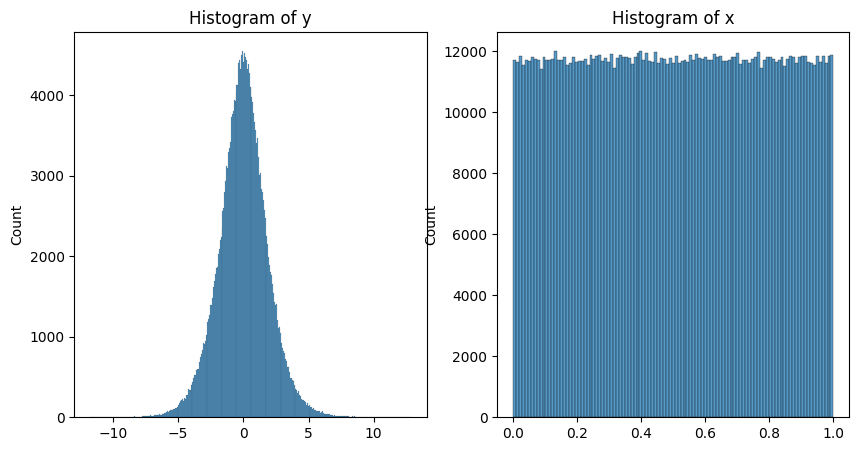

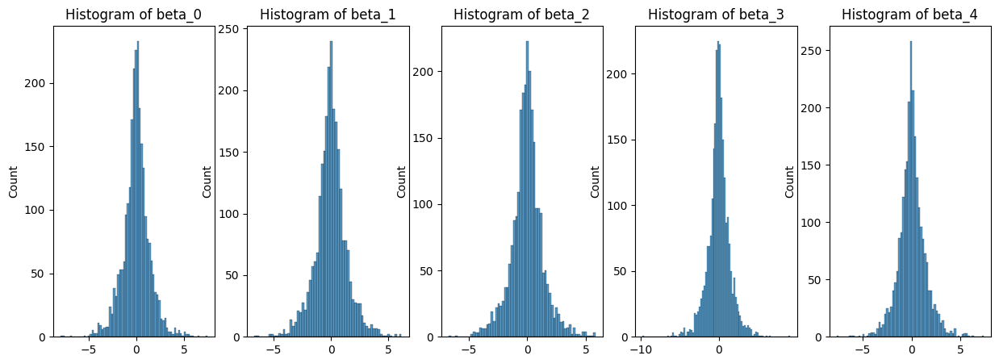

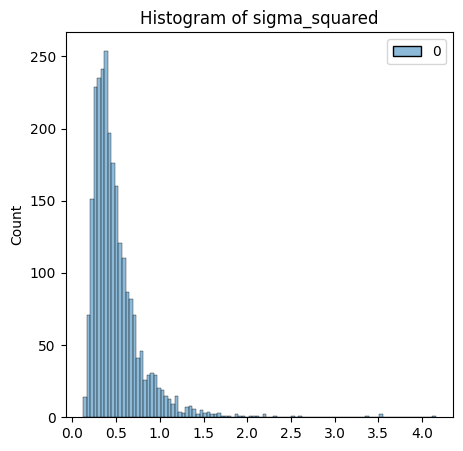

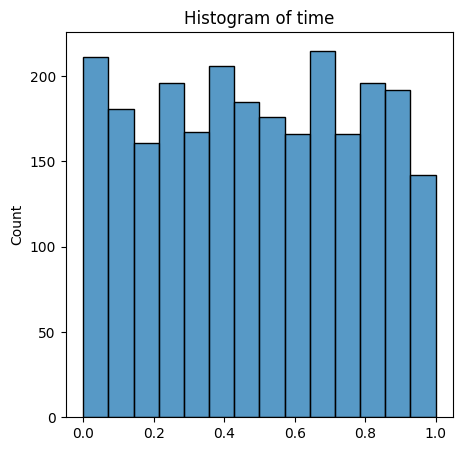

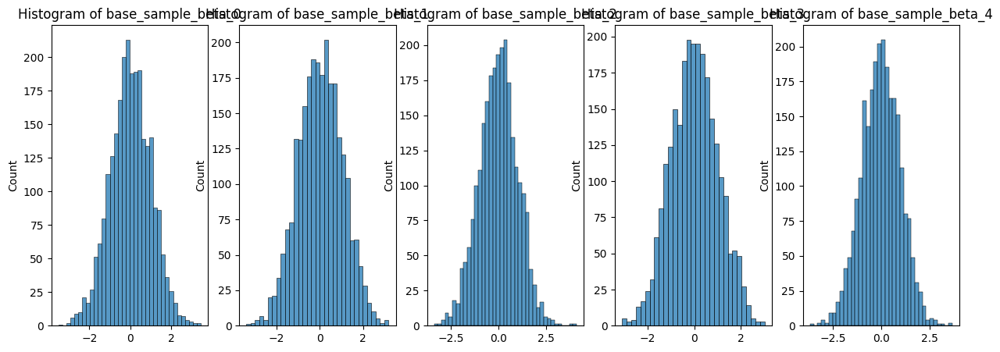

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 74.82it/s]

{'X': {'mean': tensor(0.4997), 'variance': tensor(0.0832), 'min': tensor(0.), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.0233), 'variance': tensor(3.6103), 'min': tensor(-12.6106), 'max': tensor(12.4028)}, 'beta': {'mean': tensor([ 0.0118,  0.0368, -0.0088,  0.0155, -0.0087]), 'variance': tensor([1.9680, 1.9448, 1.9200, 2.0301, 2.0948]), 'min': tensor([ -9.2030,  -6.7512,  -7.6376, -10.0703,  -9.8025]), 'max': tensor([7.5346, 6.5390, 6.5460, 5.9400, 6.7405])}}
Statistics for sigma_squared:
Mean: tensor([0.4928])
Variance: tensor([0.0771])
Min: tensor([0.1271])
Max: tensor([4.0538])


Statistics for time:
Mean: 0.5008087540278211
Variance: 0.0839739640415022
Min: 0.0008201003074645996
Max: 0.9999622106552124


Statistics for base_sample_beta:
Mean: tensor([-0.0102,  0.0031,  0.0019,  0.0334,  0.0080])
Variance: tensor([0.9556, 0.9479, 0.9425, 0.9601, 0.9699])
Min: tensor([-3.5691, -3.6385, -3.9679, -3.0117, -3.7902])
Max: tensor([3.2501, 3.7200, 3.4503, 3.1827, 3.1251])




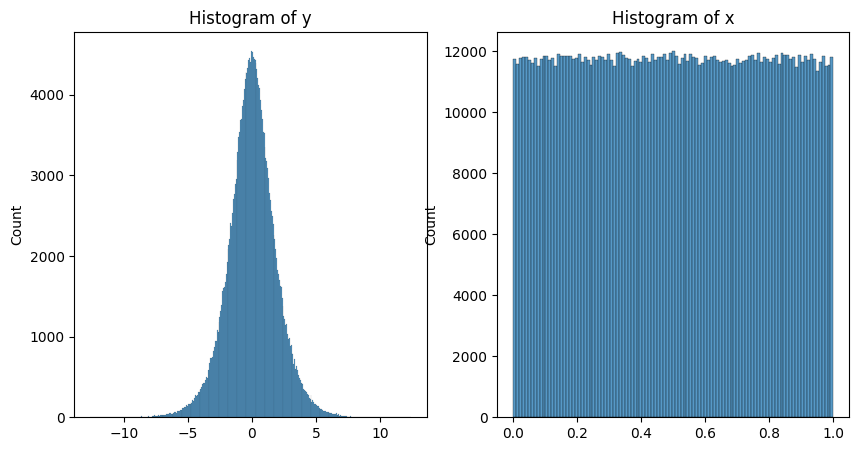

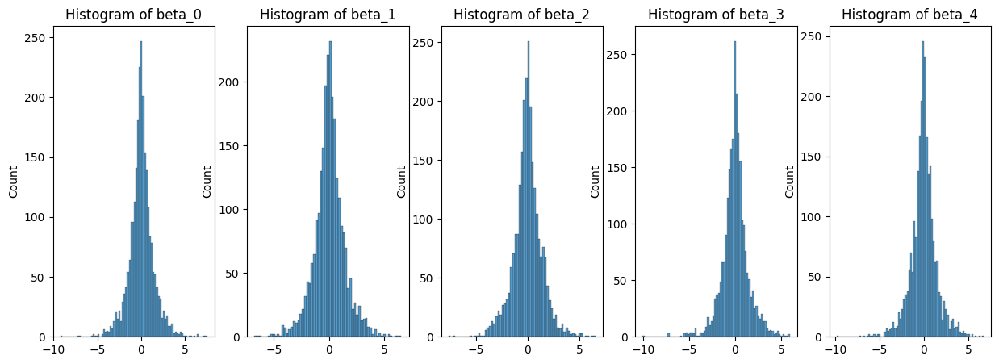

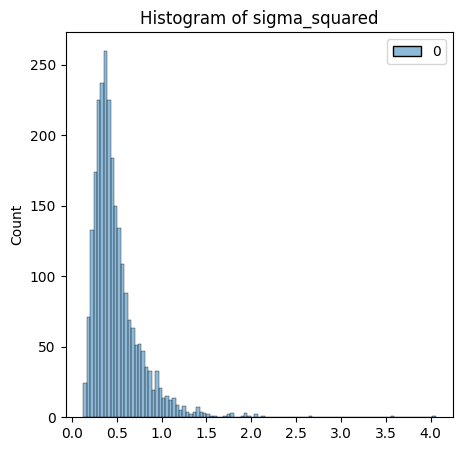

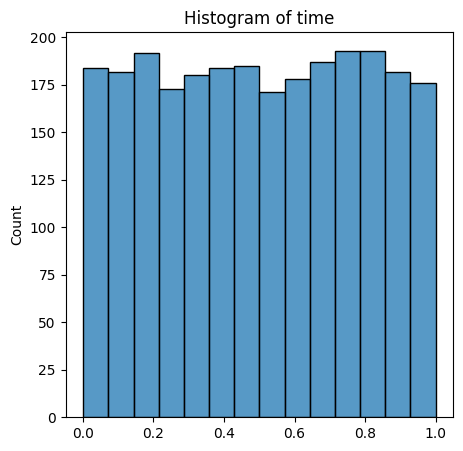

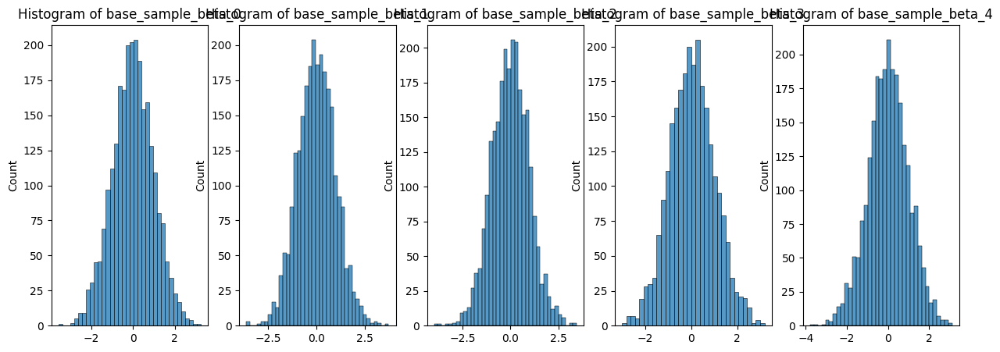

[{'X': {'mean': tensor(0.5001),
   'variance': tensor(0.0832),
   'min': tensor(1.3709e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.0021),
   'variance': tensor(3.6477),
   'min': tensor(-11.7227),
   'max': tensor(12.8323)},
  'beta': {'mean': tensor([-0.0010, -0.0021, -0.0209, -0.0126,  0.0390]),
   'variance': tensor([2.0039, 1.8554, 1.8385, 2.0390, 1.8827]),
   'min': tensor([-7.9849, -6.6373, -6.6975, -9.7521, -7.6508]),
   'max': tensor([7.4590, 6.1234, 5.8060, 9.0406, 7.3643])}},
 {'X': {'mean': tensor(0.4997),
   'variance': tensor(0.0832),
   'min': tensor(0.),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.0233),
   'variance': tensor(3.6103),
   'min': tensor(-12.6106),
   'max': tensor(12.4028)},
  'beta': {'mean': tensor([ 0.0118,  0.0368, -0.0088,  0.0155, -0.0087]),
   'variance': tensor([1.9680, 1.9448, 1.9200, 2.0301, 2.0948]),
   'min': tensor([ -9.2030,  -6.7512,  -7.6376, -10.0703,  -9.8025]),
   'max': tensor([7.5346, 6.5390, 6.5460, 5.9400, 6.740

In [ ]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

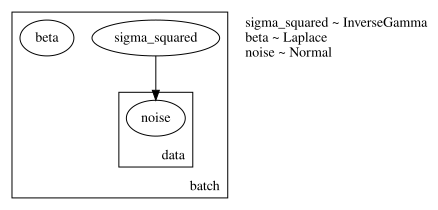

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 512,
    n_heads= 8,
    dim_feedforward=512*2,
    dropout_rate = 0.1,
    n_layers=6,
    n_skip_layers_final_heads = 2,
    n_output_units_per_head=[P, P*P, P]
)

encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples

model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 1024,
    n_hidden_units= 1024,
    n_skip_layers= 3,
    dropout_rate = 0.1
)

mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 8,
    d_ff = 512*2,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 6,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 1024,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
    encoder = encoder,
    model_posterior = model_posterior,
    mlp_to_process_encoder_output = mlp_to_process_encoder_output,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'9.63e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.0,
    NLL_Loss_function= nll_loss,
    sigma_min=1e-6,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    max_gradient_norm = 1.0

)

In [ ]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_14_09_47_47'

In [ ]:
try:
  trainer.load_best_model()
except Exception as e:
  print("Could not load model")
  print(e)
  pass

In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:37<00:00,  1.32it/s]


{'loss_mean': 0.13216106593608856,
 'loss_median': 0.13175666332244873,
 'loss_std': 0.01550857350230217,
 'loss_FM_mean': 0.13216106593608856,
 'loss_FM_median': 0.13175666332244873,
 'loss_FM_std': 0.01550857350230217,
 'loss_NLL_mean': -3.783306121826172,
 'loss_NLL_median': -3.780089855194092,
 'loss_NLL_std': 0.15016677975654602}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:31<00:00,  1.54it/s]


Epoch 0:
Training: {'loss_mean': 0.38263460993766785, 'loss_median': 0.3696626126766205, 'loss_std': 0.07113265991210938, 'loss_FM_mean': 0.38263460993766785, 'loss_FM_median': 0.3696626126766205, 'loss_FM_std': 0.07113265991210938, 'loss_NLL_mean': -1.2498061656951904, 'loss_NLL_median': -1.2809422016143799, 'loss_NLL_std': 0.3504124581813812}
Validation: {'loss_mean': 0.13126923143863678, 'loss_median': 0.12981799244880676, 'loss_std': 0.013991402462124825, 'loss_FM_mean': 0.13126923143863678, 'loss_FM_median': 0.12981799244880676, 'loss_FM_std': 0.013991402462124825, 'loss_NLL_mean': -2.3534889221191406, 'loss_NLL_median': -2.3688149452209473, 'loss_NLL_std': 0.5042108297348022}
Validation curriculum: {'loss_mean': 0.12714336812496185, 'loss_median': 0.12650948762893677, 'loss_std': 0.010518518276512623, 'loss_FM_mean': 0.12714336812496185, 'loss_FM_median': 0.12650948762893677, 'loss_FM_std': 0.010518518276512623, 'loss_NLL_mean': -2.4783806800842285, 'loss_NLL_median': -2.53363418

100%|██████████| 49/49 [00:32<00:00,  1.50it/s]


Epoch 1:
Training: {'loss_mean': 0.34086722135543823, 'loss_median': 0.33411112427711487, 'loss_std': 0.04941857233643532, 'loss_FM_mean': 0.34086722135543823, 'loss_FM_median': 0.33411112427711487, 'loss_FM_std': 0.04941857233643532, 'loss_NLL_mean': -0.4344642460346222, 'loss_NLL_median': -0.5533881187438965, 'loss_NLL_std': 0.6199074983596802}
Validation: {'loss_mean': 0.11767054349184036, 'loss_median': 0.11436068266630173, 'loss_std': 0.01252076681703329, 'loss_FM_mean': 0.11767054349184036, 'loss_FM_median': 0.11436068266630173, 'loss_FM_std': 0.01252076681703329, 'loss_NLL_mean': 0.2507317364215851, 'loss_NLL_median': 0.1938663125038147, 'loss_NLL_std': 1.314222812652588}
Validation curriculum: {'loss_mean': 0.11874616146087646, 'loss_median': 0.11680113524198532, 'loss_std': 0.010166458785533905, 'loss_FM_mean': 0.11874616146087646, 'loss_FM_median': 0.11680113524198532, 'loss_FM_std': 0.010166458785533905, 'loss_NLL_mean': 0.25288715958595276, 'loss_NLL_median': 0.325687021017

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 2:
Training: {'loss_mean': 0.3072066307067871, 'loss_median': 0.3041030466556549, 'loss_std': 0.034090641885995865, 'loss_FM_mean': 0.3072066307067871, 'loss_FM_median': 0.3041030466556549, 'loss_FM_std': 0.034090641885995865, 'loss_NLL_mean': 1.9591811895370483, 'loss_NLL_median': 1.6073330640792847, 'loss_NLL_std': 1.5269625186920166}
Validation: {'loss_mean': 0.11766884475946426, 'loss_median': 0.11787988990545273, 'loss_std': 0.010201186873018742, 'loss_FM_mean': 0.11766884475946426, 'loss_FM_median': 0.11787988990545273, 'loss_FM_std': 0.010201186873018742, 'loss_NLL_mean': 2.9573702812194824, 'loss_NLL_median': 2.8393282890319824, 'loss_NLL_std': 1.005357027053833}
Validation curriculum: {'loss_mean': 0.11711002141237259, 'loss_median': 0.11945901066064835, 'loss_std': 0.012624504044651985, 'loss_FM_mean': 0.11711002141237259, 'loss_FM_median': 0.11945901066064835, 'loss_FM_std': 0.012624504044651985, 'loss_NLL_mean': 2.886610984802246, 'loss_NLL_median': 2.7735366821289062

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 3:
Training: {'loss_mean': 0.2732219099998474, 'loss_median': 0.26868054270744324, 'loss_std': 0.028062153607606888, 'loss_FM_mean': 0.2732219099998474, 'loss_FM_median': 0.26868054270744324, 'loss_FM_std': 0.028062153607606888, 'loss_NLL_mean': 10.499959945678711, 'loss_NLL_median': 9.375858306884766, 'loss_NLL_std': 5.149782657623291}
Validation: {'loss_mean': 0.10836857557296753, 'loss_median': 0.10837304592132568, 'loss_std': 0.010298538021743298, 'loss_FM_mean': 0.10836857557296753, 'loss_FM_median': 0.10837304592132568, 'loss_FM_std': 0.010298538021743298, 'loss_NLL_mean': 21.910329818725586, 'loss_NLL_median': 21.936344146728516, 'loss_NLL_std': 2.0323545932769775}
Validation curriculum: {'loss_mean': 0.10665283352136612, 'loss_median': 0.1064254567027092, 'loss_std': 0.0093917865306139, 'loss_FM_mean': 0.10665283352136612, 'loss_FM_median': 0.1064254567027092, 'loss_FM_std': 0.0093917865306139, 'loss_NLL_mean': 22.021087646484375, 'loss_NLL_median': 21.935636520385742, 'l

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 4:
Training: {'loss_mean': 0.23898087441921234, 'loss_median': 0.23788824677467346, 'loss_std': 0.0178731307387352, 'loss_FM_mean': 0.23898087441921234, 'loss_FM_median': 0.23788824677467346, 'loss_FM_std': 0.0178731307387352, 'loss_NLL_mean': 38.138702392578125, 'loss_NLL_median': 36.62617111206055, 'loss_NLL_std': 12.903536796569824}
Validation: {'loss_mean': 0.11423426121473312, 'loss_median': 0.11336183547973633, 'loss_std': 0.009998088702559471, 'loss_FM_mean': 0.11423426121473312, 'loss_FM_median': 0.11336183547973633, 'loss_FM_std': 0.009998088702559471, 'loss_NLL_mean': 88.25701904296875, 'loss_NLL_median': 88.53321838378906, 'loss_NLL_std': 5.790781021118164}
Validation curriculum: {'loss_mean': 0.11382735520601273, 'loss_median': 0.11286871880292892, 'loss_std': 0.009042124263942242, 'loss_FM_mean': 0.11382735520601273, 'loss_FM_median': 0.11286871880292892, 'loss_FM_std': 0.009042124263942242, 'loss_NLL_mean': 88.98294067382812, 'loss_NLL_median': 88.58968353271484, 'l

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 5:
Training: {'loss_mean': 0.21357105672359467, 'loss_median': 0.21295742690563202, 'loss_std': 0.014352268539369106, 'loss_FM_mean': 0.21357105672359467, 'loss_FM_median': 0.21295742690563202, 'loss_FM_std': 0.014352268539369106, 'loss_NLL_mean': 108.92015075683594, 'loss_NLL_median': 110.50952911376953, 'loss_NLL_std': 31.096813201904297}
Validation: {'loss_mean': 0.10620371997356415, 'loss_median': 0.1057870164513588, 'loss_std': 0.0070171416737139225, 'loss_FM_mean': 0.10620371997356415, 'loss_FM_median': 0.1057870164513588, 'loss_FM_std': 0.0070171416737139225, 'loss_NLL_mean': 255.1919708251953, 'loss_NLL_median': 253.72178649902344, 'loss_NLL_std': 13.584186553955078}
Validation curriculum: {'loss_mean': 0.10792957246303558, 'loss_median': 0.106968455016613, 'loss_std': 0.008746699430048466, 'loss_FM_mean': 0.10792957246303558, 'loss_FM_median': 0.106968455016613, 'loss_FM_std': 0.008746699430048466, 'loss_NLL_mean': 257.1678161621094, 'loss_NLL_median': 254.890380859375, 

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 6:
Training: {'loss_mean': 0.1978832334280014, 'loss_median': 0.19704048335552216, 'loss_std': 0.012103887274861336, 'loss_FM_mean': 0.1978832334280014, 'loss_FM_median': 0.19704048335552216, 'loss_FM_std': 0.012103887274861336, 'loss_NLL_mean': 261.4770202636719, 'loss_NLL_median': 257.75604248046875, 'loss_NLL_std': 50.272701263427734}
Validation: {'loss_mean': 0.11113794147968292, 'loss_median': 0.1118662878870964, 'loss_std': 0.007994228042662144, 'loss_FM_mean': 0.11113794147968292, 'loss_FM_median': 0.1118662878870964, 'loss_FM_std': 0.007994228042662144, 'loss_NLL_mean': 611.6064453125, 'loss_NLL_median': 609.025390625, 'loss_NLL_std': 27.513212203979492}
Validation curriculum: {'loss_mean': 0.11201438307762146, 'loss_median': 0.11074049770832062, 'loss_std': 0.00731429411098361, 'loss_FM_mean': 0.11201438307762146, 'loss_FM_median': 0.11074049770832062, 'loss_FM_std': 0.00731429411098361, 'loss_NLL_mean': 617.7844848632812, 'loss_NLL_median': 614.2646484375, 'loss_NLL_std

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 7:
Training: {'loss_mean': 0.18569909036159515, 'loss_median': 0.18558530509471893, 'loss_std': 0.009062197990715504, 'loss_FM_mean': 0.18569909036159515, 'loss_FM_median': 0.18558530509471893, 'loss_FM_std': 0.009062197990715504, 'loss_NLL_mean': 461.7256164550781, 'loss_NLL_median': 441.6124267578125, 'loss_NLL_std': 104.54551696777344}
Validation: {'loss_mean': 0.10102573037147522, 'loss_median': 0.10040096193552017, 'loss_std': 0.007048648316413164, 'loss_FM_mean': 0.10102573037147522, 'loss_FM_median': 0.10040096193552017, 'loss_FM_std': 0.007048648316413164, 'loss_NLL_mean': 744.0260009765625, 'loss_NLL_median': 746.934326171875, 'loss_NLL_std': 23.37394905090332}
Validation curriculum: {'loss_mean': 0.10112164914608002, 'loss_median': 0.10133794695138931, 'loss_std': 0.005709455348551273, 'loss_FM_mean': 0.10112164914608002, 'loss_FM_median': 0.10133794695138931, 'loss_FM_std': 0.005709455348551273, 'loss_NLL_mean': 742.6294555664062, 'loss_NLL_median': 742.4305419921875, 

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 8:
Training: {'loss_mean': 0.18108418583869934, 'loss_median': 0.1797209233045578, 'loss_std': 0.009777592495083809, 'loss_FM_mean': 0.18108418583869934, 'loss_FM_median': 0.1797209233045578, 'loss_FM_std': 0.009777592495083809, 'loss_NLL_mean': 588.5838623046875, 'loss_NLL_median': 590.965576171875, 'loss_NLL_std': 83.53267669677734}
Validation: {'loss_mean': 0.09774535149335861, 'loss_median': 0.09832852333784103, 'loss_std': 0.005950514227151871, 'loss_FM_mean': 0.09774535149335861, 'loss_FM_median': 0.09832852333784103, 'loss_FM_std': 0.005950514227151871, 'loss_NLL_mean': 916.477783203125, 'loss_NLL_median': 918.1995849609375, 'loss_NLL_std': 31.270830154418945}
Validation curriculum: {'loss_mean': 0.09564784914255142, 'loss_median': 0.09532707184553146, 'loss_std': 0.005656184628605843, 'loss_FM_mean': 0.09564784914255142, 'loss_FM_median': 0.09532707184553146, 'loss_FM_std': 0.005656184628605843, 'loss_NLL_mean': 916.8486938476562, 'loss_NLL_median': 914.7056884765625, 'lo

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 9:
Training: {'loss_mean': 0.1758117377758026, 'loss_median': 0.17431825399398804, 'loss_std': 0.01105737965553999, 'loss_FM_mean': 0.1758117377758026, 'loss_FM_median': 0.17431825399398804, 'loss_FM_std': 0.01105737965553999, 'loss_NLL_mean': 708.535400390625, 'loss_NLL_median': 668.501220703125, 'loss_NLL_std': 174.37388610839844}
Validation: {'loss_mean': 0.0984685942530632, 'loss_median': 0.0980389341711998, 'loss_std': 0.005382325500249863, 'loss_FM_mean': 0.0984685942530632, 'loss_FM_median': 0.0980389341711998, 'loss_FM_std': 0.005382325500249863, 'loss_NLL_mean': 1008.449462890625, 'loss_NLL_median': 1012.2859497070312, 'loss_NLL_std': 28.530630111694336}
Validation curriculum: {'loss_mean': 0.0986018255352974, 'loss_median': 0.09869327396154404, 'loss_std': 0.00531065883114934, 'loss_FM_mean': 0.0986018255352974, 'loss_FM_median': 0.09869327396154404, 'loss_FM_std': 0.00531065883114934, 'loss_NLL_mean': 1012.1849365234375, 'loss_NLL_median': 1011.4629516601562, 'loss_NLL

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 10:
Training: {'loss_mean': 0.17135918140411377, 'loss_median': 0.17065849900245667, 'loss_std': 0.008823268115520477, 'loss_FM_mean': 0.17135918140411377, 'loss_FM_median': 0.17065849900245667, 'loss_FM_std': 0.008823268115520477, 'loss_NLL_mean': 841.3460693359375, 'loss_NLL_median': 834.2965087890625, 'loss_NLL_std': 114.04908752441406}
Validation: {'loss_mean': 0.09660738706588745, 'loss_median': 0.09570381790399551, 'loss_std': 0.004862104542553425, 'loss_FM_mean': 0.09660738706588745, 'loss_FM_median': 0.09570381790399551, 'loss_FM_std': 0.004862104542553425, 'loss_NLL_mean': 1015.0072631835938, 'loss_NLL_median': 1017.064208984375, 'loss_NLL_std': 26.902082443237305}
Validation curriculum: {'loss_mean': 0.0959661602973938, 'loss_median': 0.0958038717508316, 'loss_std': 0.004764550365507603, 'loss_FM_mean': 0.0959661602973938, 'loss_FM_median': 0.0958038717508316, 'loss_FM_std': 0.004764550365507603, 'loss_NLL_mean': 1009.6048583984375, 'loss_NLL_median': 1011.1504516601562

100%|██████████| 49/49 [00:28<00:00,  1.72it/s]


Epoch 11:
Training: {'loss_mean': 0.1636388599872589, 'loss_median': 0.1640087217092514, 'loss_std': 0.006405978463590145, 'loss_FM_mean': 0.1636388599872589, 'loss_FM_median': 0.1640087217092514, 'loss_FM_std': 0.006405978463590145, 'loss_NLL_mean': 785.0016479492188, 'loss_NLL_median': 774.475830078125, 'loss_NLL_std': 107.84786987304688}
Validation: {'loss_mean': 0.09225603193044662, 'loss_median': 0.09157970547676086, 'loss_std': 0.004653703887015581, 'loss_FM_mean': 0.09225603193044662, 'loss_FM_median': 0.09157970547676086, 'loss_FM_std': 0.004653703887015581, 'loss_NLL_mean': 921.7354736328125, 'loss_NLL_median': 921.3221435546875, 'loss_NLL_std': 27.993038177490234}
Validation curriculum: {'loss_mean': 0.09361155331134796, 'loss_median': 0.09365095943212509, 'loss_std': 0.004186924081295729, 'loss_FM_mean': 0.09361155331134796, 'loss_FM_median': 0.09365095943212509, 'loss_FM_std': 0.004186924081295729, 'loss_NLL_mean': 917.5404052734375, 'loss_NLL_median': 922.3235473632812, 'l

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 12:
Training: {'loss_mean': 0.1594545841217041, 'loss_median': 0.15905530750751495, 'loss_std': 0.007979129441082478, 'loss_FM_mean': 0.1594545841217041, 'loss_FM_median': 0.15905530750751495, 'loss_FM_std': 0.007979129441082478, 'loss_NLL_mean': 852.6760864257812, 'loss_NLL_median': 838.9500732421875, 'loss_NLL_std': 176.66810607910156}
Validation: {'loss_mean': 0.10017699003219604, 'loss_median': 0.10065484046936035, 'loss_std': 0.003687220625579357, 'loss_FM_mean': 0.10017699003219604, 'loss_FM_median': 0.10065484046936035, 'loss_FM_std': 0.003687220625579357, 'loss_NLL_mean': 1092.099365234375, 'loss_NLL_median': 1091.5811767578125, 'loss_NLL_std': 27.85577964782715}
Validation curriculum: {'loss_mean': 0.09975675493478775, 'loss_median': 0.10027992725372314, 'loss_std': 0.004225431475788355, 'loss_FM_mean': 0.09975675493478775, 'loss_FM_median': 0.10027992725372314, 'loss_FM_std': 0.004225431475788355, 'loss_NLL_mean': 1096.2794189453125, 'loss_NLL_median': 1104.827392578125

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 13:
Training: {'loss_mean': 0.150944784283638, 'loss_median': 0.151312455534935, 'loss_std': 0.005393004976212978, 'loss_FM_mean': 0.150944784283638, 'loss_FM_median': 0.151312455534935, 'loss_FM_std': 0.005393004976212978, 'loss_NLL_mean': 861.9697875976562, 'loss_NLL_median': 859.9466552734375, 'loss_NLL_std': 95.69058990478516}
Validation: {'loss_mean': 0.0887114480137825, 'loss_median': 0.0893494114279747, 'loss_std': 0.004001109395176172, 'loss_FM_mean': 0.0887114480137825, 'loss_FM_median': 0.0893494114279747, 'loss_FM_std': 0.004001109395176172, 'loss_NLL_mean': 1031.0047607421875, 'loss_NLL_median': 1028.46728515625, 'loss_NLL_std': 24.179155349731445}
Validation curriculum: {'loss_mean': 0.08821684122085571, 'loss_median': 0.08772474527359009, 'loss_std': 0.0036142372991889715, 'loss_FM_mean': 0.08821684122085571, 'loss_FM_median': 0.08772474527359009, 'loss_FM_std': 0.0036142372991889715, 'loss_NLL_mean': 1024.541748046875, 'loss_NLL_median': 1021.0576782226562, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 14:
Training: {'loss_mean': 0.14478446543216705, 'loss_median': 0.14457391202449799, 'loss_std': 0.0054464577697217464, 'loss_FM_mean': 0.14478446543216705, 'loss_FM_median': 0.14457391202449799, 'loss_FM_std': 0.0054464577697217464, 'loss_NLL_mean': 897.2363891601562, 'loss_NLL_median': 868.6906127929688, 'loss_NLL_std': 161.05397033691406}
Validation: {'loss_mean': 0.08879794180393219, 'loss_median': 0.08916721493005753, 'loss_std': 0.004009313881397247, 'loss_FM_mean': 0.08879794180393219, 'loss_FM_median': 0.08916721493005753, 'loss_FM_std': 0.004009313881397247, 'loss_NLL_mean': 1212.18359375, 'loss_NLL_median': 1204.9033203125, 'loss_NLL_std': 38.78071975708008}
Validation curriculum: {'loss_mean': 0.0870470479130745, 'loss_median': 0.08744757622480392, 'loss_std': 0.004165667109191418, 'loss_FM_mean': 0.0870470479130745, 'loss_FM_median': 0.08744757622480392, 'loss_FM_std': 0.004165667109191418, 'loss_NLL_mean': 1216.7025146484375, 'loss_NLL_median': 1218.348876953125, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 15:
Training: {'loss_mean': 0.14018630981445312, 'loss_median': 0.13936689496040344, 'loss_std': 0.006201617419719696, 'loss_FM_mean': 0.14018630981445312, 'loss_FM_median': 0.13936689496040344, 'loss_FM_std': 0.006201617419719696, 'loss_NLL_mean': 1033.36474609375, 'loss_NLL_median': 1025.693359375, 'loss_NLL_std': 161.33399963378906}
Validation: {'loss_mean': 0.0864982008934021, 'loss_median': 0.08689325302839279, 'loss_std': 0.003317005932331085, 'loss_FM_mean': 0.0864982008934021, 'loss_FM_median': 0.08689325302839279, 'loss_FM_std': 0.003317005932331085, 'loss_NLL_mean': 941.831298828125, 'loss_NLL_median': 936.0623779296875, 'loss_NLL_std': 31.9160099029541}
Validation curriculum: {'loss_mean': 0.0864495038986206, 'loss_median': 0.08624135702848434, 'loss_std': 0.0038140621036291122, 'loss_FM_mean': 0.0864495038986206, 'loss_FM_median': 0.08624135702848434, 'loss_FM_std': 0.0038140621036291122, 'loss_NLL_mean': 937.9963989257812, 'loss_NLL_median': 939.273681640625, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 16:
Training: {'loss_mean': 0.13521763682365417, 'loss_median': 0.13442789018154144, 'loss_std': 0.005852174013853073, 'loss_FM_mean': 0.13521763682365417, 'loss_FM_median': 0.13442789018154144, 'loss_FM_std': 0.005852174013853073, 'loss_NLL_mean': 1078.51708984375, 'loss_NLL_median': 1059.1944580078125, 'loss_NLL_std': 210.91331481933594}
Validation: {'loss_mean': 0.088936448097229, 'loss_median': 0.08919210731983185, 'loss_std': 0.004057648126035929, 'loss_FM_mean': 0.088936448097229, 'loss_FM_median': 0.08919210731983185, 'loss_FM_std': 0.004057648126035929, 'loss_NLL_mean': 1351.15380859375, 'loss_NLL_median': 1354.4774169921875, 'loss_NLL_std': 43.89300537109375}
Validation curriculum: {'loss_mean': 0.08827194571495056, 'loss_median': 0.08741827309131622, 'loss_std': 0.0038363162893801928, 'loss_FM_mean': 0.08827194571495056, 'loss_FM_median': 0.08741827309131622, 'loss_FM_std': 0.0038363162893801928, 'loss_NLL_mean': 1337.0382080078125, 'loss_NLL_median': 1331.0682373046875

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 17:
Training: {'loss_mean': 0.12862923741340637, 'loss_median': 0.1278386414051056, 'loss_std': 0.005151638761162758, 'loss_FM_mean': 0.12862923741340637, 'loss_FM_median': 0.1278386414051056, 'loss_FM_std': 0.005151638761162758, 'loss_NLL_mean': 1034.57275390625, 'loss_NLL_median': 976.1658935546875, 'loss_NLL_std': 221.71241760253906}
Validation: {'loss_mean': 0.08876018226146698, 'loss_median': 0.08911141008138657, 'loss_std': 0.0032298581209033728, 'loss_FM_mean': 0.08876018226146698, 'loss_FM_median': 0.08911141008138657, 'loss_FM_std': 0.0032298581209033728, 'loss_NLL_mean': 1293.9273681640625, 'loss_NLL_median': 1292.14501953125, 'loss_NLL_std': 38.56496047973633}
Validation curriculum: {'loss_mean': 0.08798297494649887, 'loss_median': 0.08788313716650009, 'loss_std': 0.003133493708446622, 'loss_FM_mean': 0.08798297494649887, 'loss_FM_median': 0.08788313716650009, 'loss_FM_std': 0.003133493708446622, 'loss_NLL_mean': 1281.40478515625, 'loss_NLL_median': 1281.02294921875, '

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 18:
Training: {'loss_mean': 0.12132963538169861, 'loss_median': 0.12108047306537628, 'loss_std': 0.004488376434892416, 'loss_FM_mean': 0.12132963538169861, 'loss_FM_median': 0.12108047306537628, 'loss_FM_std': 0.004488376434892416, 'loss_NLL_mean': 938.720947265625, 'loss_NLL_median': 924.7471923828125, 'loss_NLL_std': 170.0264129638672}
Validation: {'loss_mean': 0.0802120640873909, 'loss_median': 0.08019169420003891, 'loss_std': 0.003006129991263151, 'loss_FM_mean': 0.0802120640873909, 'loss_FM_median': 0.08019169420003891, 'loss_FM_std': 0.003006129991263151, 'loss_NLL_mean': 1237.1097412109375, 'loss_NLL_median': 1240.6834716796875, 'loss_NLL_std': 38.5604248046875}
Validation curriculum: {'loss_mean': 0.08023746311664581, 'loss_median': 0.07947532087564468, 'loss_std': 0.0032303864136338234, 'loss_FM_mean': 0.08023746311664581, 'loss_FM_median': 0.07947532087564468, 'loss_FM_std': 0.0032303864136338234, 'loss_NLL_mean': 1230.7652587890625, 'loss_NLL_median': 1230.491088867187

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 19:
Training: {'loss_mean': 0.11843165755271912, 'loss_median': 0.1181701198220253, 'loss_std': 0.005742094945162535, 'loss_FM_mean': 0.11843165755271912, 'loss_FM_median': 0.1181701198220253, 'loss_FM_std': 0.005742094945162535, 'loss_NLL_mean': 1346.9219970703125, 'loss_NLL_median': 1328.7784423828125, 'loss_NLL_std': 219.56285095214844}
Validation: {'loss_mean': 0.07355385273694992, 'loss_median': 0.07389610260725021, 'loss_std': 0.002674823859706521, 'loss_FM_mean': 0.07355385273694992, 'loss_FM_median': 0.07389610260725021, 'loss_FM_std': 0.002674823859706521, 'loss_NLL_mean': 1584.1650390625, 'loss_NLL_median': 1585.6300048828125, 'loss_NLL_std': 43.16526412963867}
Validation curriculum: {'loss_mean': 0.07391407340765, 'loss_median': 0.07368641346693039, 'loss_std': 0.0026786073576658964, 'loss_FM_mean': 0.07391407340765, 'loss_FM_median': 0.07368641346693039, 'loss_FM_std': 0.0026786073576658964, 'loss_NLL_mean': 1579.6458740234375, 'loss_NLL_median': 1567.2451171875, 'los

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 20:
Training: {'loss_mean': 0.11751355230808258, 'loss_median': 0.11718060076236725, 'loss_std': 0.006601077504456043, 'loss_FM_mean': 0.11751355230808258, 'loss_FM_median': 0.11718060076236725, 'loss_FM_std': 0.006601077504456043, 'loss_NLL_mean': 1375.502197265625, 'loss_NLL_median': 1368.25, 'loss_NLL_std': 256.35797119140625}
Validation: {'loss_mean': 0.07476228475570679, 'loss_median': 0.07455835491418839, 'loss_std': 0.0027652569115161896, 'loss_FM_mean': 0.07476228475570679, 'loss_FM_median': 0.07455835491418839, 'loss_FM_std': 0.0027652569115161896, 'loss_NLL_mean': 1393.265625, 'loss_NLL_median': 1391.558349609375, 'loss_NLL_std': 48.683109283447266}
Validation curriculum: {'loss_mean': 0.0752292200922966, 'loss_median': 0.07536186277866364, 'loss_std': 0.00340997870080173, 'loss_FM_mean': 0.0752292200922966, 'loss_FM_median': 0.07536186277866364, 'loss_FM_std': 0.00340997870080173, 'loss_NLL_mean': 1396.5670166015625, 'loss_NLL_median': 1396.4130859375, 'loss_NLL_std': 

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 21:
Training: {'loss_mean': 0.11208036541938782, 'loss_median': 0.11120939254760742, 'loss_std': 0.005697970744222403, 'loss_FM_mean': 0.11208036541938782, 'loss_FM_median': 0.11120939254760742, 'loss_FM_std': 0.005697970744222403, 'loss_NLL_mean': 1454.5953369140625, 'loss_NLL_median': 1404.51123046875, 'loss_NLL_std': 303.4135437011719}
Validation: {'loss_mean': 0.08516186475753784, 'loss_median': 0.08519569039344788, 'loss_std': 0.002556802937760949, 'loss_FM_mean': 0.08516186475753784, 'loss_FM_median': 0.08519569039344788, 'loss_FM_std': 0.002556802937760949, 'loss_NLL_mean': 1802.70458984375, 'loss_NLL_median': 1806.3359375, 'loss_NLL_std': 48.16731262207031}
Validation curriculum: {'loss_mean': 0.08557390421628952, 'loss_median': 0.08512945473194122, 'loss_std': 0.002896609017625451, 'loss_FM_mean': 0.08557390421628952, 'loss_FM_median': 0.08512945473194122, 'loss_FM_std': 0.002896609017625451, 'loss_NLL_mean': 1788.7529296875, 'loss_NLL_median': 1781.0743408203125, 'loss_

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 22:
Training: {'loss_mean': 0.10790550708770752, 'loss_median': 0.10756249725818634, 'loss_std': 0.005261918995529413, 'loss_FM_mean': 0.10790550708770752, 'loss_FM_median': 0.10756249725818634, 'loss_FM_std': 0.005261918995529413, 'loss_NLL_mean': 1409.963623046875, 'loss_NLL_median': 1404.7967529296875, 'loss_NLL_std': 263.56024169921875}
Validation: {'loss_mean': 0.06861666589975357, 'loss_median': 0.06807505339384079, 'loss_std': 0.002288785530254245, 'loss_FM_mean': 0.06861666589975357, 'loss_FM_median': 0.06807505339384079, 'loss_FM_std': 0.002288785530254245, 'loss_NLL_mean': 1722.8433837890625, 'loss_NLL_median': 1719.40625, 'loss_NLL_std': 52.25954818725586}
Validation curriculum: {'loss_mean': 0.06841812282800674, 'loss_median': 0.06854894012212753, 'loss_std': 0.002453526481986046, 'loss_FM_mean': 0.06841812282800674, 'loss_FM_median': 0.06854894012212753, 'loss_FM_std': 0.002453526481986046, 'loss_NLL_mean': 1712.478271484375, 'loss_NLL_median': 1707.4453125, 'loss_NL

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 23:
Training: {'loss_mean': 0.10606691986322403, 'loss_median': 0.10496199131011963, 'loss_std': 0.009329166263341904, 'loss_FM_mean': 0.10606691986322403, 'loss_FM_median': 0.10496199131011963, 'loss_FM_std': 0.009329166263341904, 'loss_NLL_mean': 1614.1895751953125, 'loss_NLL_median': 1572.45751953125, 'loss_NLL_std': 331.7585754394531}
Validation: {'loss_mean': 0.10060281306505203, 'loss_median': 0.1008165255188942, 'loss_std': 0.007633150555193424, 'loss_FM_mean': 0.10060281306505203, 'loss_FM_median': 0.1008165255188942, 'loss_FM_std': 0.007633150555193424, 'loss_NLL_mean': 1904.1837158203125, 'loss_NLL_median': 1908.740966796875, 'loss_NLL_std': 51.64809036254883}
Validation curriculum: {'loss_mean': 0.10058113187551498, 'loss_median': 0.10030951350927353, 'loss_std': 0.007857449352741241, 'loss_FM_mean': 0.10058113187551498, 'loss_FM_median': 0.10030951350927353, 'loss_FM_std': 0.007857449352741241, 'loss_NLL_mean': 1905.8916015625, 'loss_NLL_median': 1902.041015625, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 24:
Training: {'loss_mean': 0.10394440591335297, 'loss_median': 0.10228496789932251, 'loss_std': 0.009764697402715683, 'loss_FM_mean': 0.10394440591335297, 'loss_FM_median': 0.10228496789932251, 'loss_FM_std': 0.009764697402715683, 'loss_NLL_mean': 1569.5469970703125, 'loss_NLL_median': 1541.3897705078125, 'loss_NLL_std': 329.6565856933594}
Validation: {'loss_mean': 0.06878995150327682, 'loss_median': 0.06904102861881256, 'loss_std': 0.0025841661263257265, 'loss_FM_mean': 0.06878995150327682, 'loss_FM_median': 0.06904102861881256, 'loss_FM_std': 0.0025841661263257265, 'loss_NLL_mean': 1550.403076171875, 'loss_NLL_median': 1545.72509765625, 'loss_NLL_std': 43.617218017578125}
Validation curriculum: {'loss_mean': 0.06904326379299164, 'loss_median': 0.06899023801088333, 'loss_std': 0.0027144146151840687, 'loss_FM_mean': 0.06904326379299164, 'loss_FM_median': 0.06899023801088333, 'loss_FM_std': 0.0027144146151840687, 'loss_NLL_mean': 1566.619384765625, 'loss_NLL_median': 1567.9594726

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 25:
Training: {'loss_mean': 0.0963141992688179, 'loss_median': 0.09585099667310715, 'loss_std': 0.00398580776527524, 'loss_FM_mean': 0.0963141992688179, 'loss_FM_median': 0.09585099667310715, 'loss_FM_std': 0.00398580776527524, 'loss_NLL_mean': 1445.051513671875, 'loss_NLL_median': 1403.4365234375, 'loss_NLL_std': 304.81683349609375}
Validation: {'loss_mean': 0.07643204182386398, 'loss_median': 0.07680585235357285, 'loss_std': 0.002870068186894059, 'loss_FM_mean': 0.07643204182386398, 'loss_FM_median': 0.07680585235357285, 'loss_FM_std': 0.002870068186894059, 'loss_NLL_mean': 1547.9716796875, 'loss_NLL_median': 1545.2447509765625, 'loss_NLL_std': 49.791141510009766}
Validation curriculum: {'loss_mean': 0.07629340142011642, 'loss_median': 0.0759844109416008, 'loss_std': 0.0025084700901061296, 'loss_FM_mean': 0.07629340142011642, 'loss_FM_median': 0.0759844109416008, 'loss_FM_std': 0.0025084700901061296, 'loss_NLL_mean': 1558.67724609375, 'loss_NLL_median': 1547.899658203125, 'loss

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 26:
Training: {'loss_mean': 0.09281180799007416, 'loss_median': 0.09242077171802521, 'loss_std': 0.0035590962506830692, 'loss_FM_mean': 0.09281180799007416, 'loss_FM_median': 0.09242077171802521, 'loss_FM_std': 0.0035590962506830692, 'loss_NLL_mean': 1627.8468017578125, 'loss_NLL_median': 1630.869384765625, 'loss_NLL_std': 236.13299560546875}
Validation: {'loss_mean': 0.05835544317960739, 'loss_median': 0.057895123958587646, 'loss_std': 0.0022996114566922188, 'loss_FM_mean': 0.05835544317960739, 'loss_FM_median': 0.057895123958587646, 'loss_FM_std': 0.0022996114566922188, 'loss_NLL_mean': 1732.1014404296875, 'loss_NLL_median': 1727.463623046875, 'loss_NLL_std': 49.15819549560547}
Validation curriculum: {'loss_mean': 0.05900253728032112, 'loss_median': 0.05923136696219444, 'loss_std': 0.002356333192437887, 'loss_FM_mean': 0.05900253728032112, 'loss_FM_median': 0.05923136696219444, 'loss_FM_std': 0.002356333192437887, 'loss_NLL_mean': 1725.6160888671875, 'loss_NLL_median': 1715.135

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 27:
Training: {'loss_mean': 0.09066857397556305, 'loss_median': 0.09035543352365494, 'loss_std': 0.003457227721810341, 'loss_FM_mean': 0.09066857397556305, 'loss_FM_median': 0.09035543352365494, 'loss_FM_std': 0.003457227721810341, 'loss_NLL_mean': 1557.3883056640625, 'loss_NLL_median': 1536.6475830078125, 'loss_NLL_std': 245.71937561035156}
Validation: {'loss_mean': 0.06044759973883629, 'loss_median': 0.06030751019716263, 'loss_std': 0.0021031033247709274, 'loss_FM_mean': 0.06044759973883629, 'loss_FM_median': 0.06030751019716263, 'loss_FM_std': 0.0021031033247709274, 'loss_NLL_mean': 1844.4234619140625, 'loss_NLL_median': 1839.320556640625, 'loss_NLL_std': 47.43039321899414}
Validation curriculum: {'loss_mean': 0.060500387102365494, 'loss_median': 0.06038856506347656, 'loss_std': 0.0024995161220431328, 'loss_FM_mean': 0.060500387102365494, 'loss_FM_median': 0.06038856506347656, 'loss_FM_std': 0.0024995161220431328, 'loss_NLL_mean': 1840.808837890625, 'loss_NLL_median': 1840.686

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 28:
Training: {'loss_mean': 0.08903450518846512, 'loss_median': 0.08882184326648712, 'loss_std': 0.003747606184333563, 'loss_FM_mean': 0.08903450518846512, 'loss_FM_median': 0.08882184326648712, 'loss_FM_std': 0.003747606184333563, 'loss_NLL_mean': 1756.0023193359375, 'loss_NLL_median': 1762.4638671875, 'loss_NLL_std': 261.9754638671875}
Validation: {'loss_mean': 0.0671110600233078, 'loss_median': 0.06710755079984665, 'loss_std': 0.0021833074279129505, 'loss_FM_mean': 0.0671110600233078, 'loss_FM_median': 0.06710755079984665, 'loss_FM_std': 0.0021833074279129505, 'loss_NLL_mean': 1549.97802734375, 'loss_NLL_median': 1546.268310546875, 'loss_NLL_std': 50.216827392578125}
Validation curriculum: {'loss_mean': 0.06717164814472198, 'loss_median': 0.0673743486404419, 'loss_std': 0.0018666046671569347, 'loss_FM_mean': 0.06717164814472198, 'loss_FM_median': 0.0673743486404419, 'loss_FM_std': 0.0018666046671569347, 'loss_NLL_mean': 1555.51318359375, 'loss_NLL_median': 1554.6181640625, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 29:
Training: {'loss_mean': 0.08644521236419678, 'loss_median': 0.08644645661115646, 'loss_std': 0.0033059220295399427, 'loss_FM_mean': 0.08644521236419678, 'loss_FM_median': 0.08644645661115646, 'loss_FM_std': 0.0033059220295399427, 'loss_NLL_mean': 1725.8541259765625, 'loss_NLL_median': 1717.12158203125, 'loss_NLL_std': 250.3906707763672}
Validation: {'loss_mean': 0.07252249866724014, 'loss_median': 0.07222586125135422, 'loss_std': 0.0024761001113802195, 'loss_FM_mean': 0.07252249866724014, 'loss_FM_median': 0.07222586125135422, 'loss_FM_std': 0.0024761001113802195, 'loss_NLL_mean': 1542.849853515625, 'loss_NLL_median': 1546.469482421875, 'loss_NLL_std': 51.29187774658203}
Validation curriculum: {'loss_mean': 0.07205143570899963, 'loss_median': 0.07240672409534454, 'loss_std': 0.001889102510176599, 'loss_FM_mean': 0.07205143570899963, 'loss_FM_median': 0.07240672409534454, 'loss_FM_std': 0.001889102510176599, 'loss_NLL_mean': 1543.5599365234375, 'loss_NLL_median': 1543.83203125

100%|██████████| 49/49 [00:28<00:00,  1.73it/s]


Epoch 30:
Training: {'loss_mean': 0.08521472662687302, 'loss_median': 0.08496782183647156, 'loss_std': 0.0038438644260168076, 'loss_FM_mean': 0.08521472662687302, 'loss_FM_median': 0.08496782183647156, 'loss_FM_std': 0.0038438644260168076, 'loss_NLL_mean': 1911.0172119140625, 'loss_NLL_median': 1900.74755859375, 'loss_NLL_std': 251.5995635986328}
Validation: {'loss_mean': 0.08521905541419983, 'loss_median': 0.08498305082321167, 'loss_std': 0.0028951505664736032, 'loss_FM_mean': 0.08521905541419983, 'loss_FM_median': 0.08498305082321167, 'loss_FM_std': 0.0028951505664736032, 'loss_NLL_mean': 1840.627685546875, 'loss_NLL_median': 1840.8505859375, 'loss_NLL_std': 48.6677360534668}
Validation curriculum: {'loss_mean': 0.08466967940330505, 'loss_median': 0.08484524488449097, 'loss_std': 0.0024518813006579876, 'loss_FM_mean': 0.08466967940330505, 'loss_FM_median': 0.08484524488449097, 'loss_FM_std': 0.0024518813006579876, 'loss_NLL_mean': 1843.5587158203125, 'loss_NLL_median': 1843.474365234

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 31:
Training: {'loss_mean': 0.08291635662317276, 'loss_median': 0.08292453736066818, 'loss_std': 0.003291850443929434, 'loss_FM_mean': 0.08291635662317276, 'loss_FM_median': 0.08292453736066818, 'loss_FM_std': 0.003291850443929434, 'loss_NLL_mean': 1939.650146484375, 'loss_NLL_median': 1948.334228515625, 'loss_NLL_std': 265.7320556640625}
Validation: {'loss_mean': 0.056800831109285355, 'loss_median': 0.0564766600728035, 'loss_std': 0.002517654560506344, 'loss_FM_mean': 0.056800831109285355, 'loss_FM_median': 0.0564766600728035, 'loss_FM_std': 0.002517654560506344, 'loss_NLL_mean': 1873.540283203125, 'loss_NLL_median': 1876.358154296875, 'loss_NLL_std': 61.22626495361328}
Validation curriculum: {'loss_mean': 0.05734505504369736, 'loss_median': 0.05691332742571831, 'loss_std': 0.0019508054247125983, 'loss_FM_mean': 0.05734505504369736, 'loss_FM_median': 0.05691332742571831, 'loss_FM_std': 0.0019508054247125983, 'loss_NLL_mean': 1865.5865478515625, 'loss_NLL_median': 1865.5164794921

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]


Epoch 32:
Training: {'loss_mean': 0.0822380855679512, 'loss_median': 0.08194756507873535, 'loss_std': 0.004603939596563578, 'loss_FM_mean': 0.0822380855679512, 'loss_FM_median': 0.08194756507873535, 'loss_FM_std': 0.004603939596563578, 'loss_NLL_mean': 2016.2138671875, 'loss_NLL_median': 1995.970947265625, 'loss_NLL_std': 328.91790771484375}
Validation: {'loss_mean': 0.05982114002108574, 'loss_median': 0.05995453521609306, 'loss_std': 0.0022827857173979282, 'loss_FM_mean': 0.05982114002108574, 'loss_FM_median': 0.05995453521609306, 'loss_FM_std': 0.0022827857173979282, 'loss_NLL_mean': 2386.85302734375, 'loss_NLL_median': 2394.37158203125, 'loss_NLL_std': 77.58277130126953}
Validation curriculum: {'loss_mean': 0.06084752455353737, 'loss_median': 0.06108754500746727, 'loss_std': 0.0024049014318734407, 'loss_FM_mean': 0.06084752455353737, 'loss_FM_median': 0.06108754500746727, 'loss_FM_std': 0.0024049014318734407, 'loss_NLL_mean': 2368.101318359375, 'loss_NLL_median': 2359.96533203125, '

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 33:
Training: {'loss_mean': 0.08209381252527237, 'loss_median': 0.08170454949140549, 'loss_std': 0.004348549991846085, 'loss_FM_mean': 0.08209381252527237, 'loss_FM_median': 0.08170454949140549, 'loss_FM_std': 0.004348549991846085, 'loss_NLL_mean': 1952.660400390625, 'loss_NLL_median': 1970.1092529296875, 'loss_NLL_std': 321.5926208496094}
Validation: {'loss_mean': 0.05618271604180336, 'loss_median': 0.05606142431497574, 'loss_std': 0.002291977172717452, 'loss_FM_mean': 0.05618271604180336, 'loss_FM_median': 0.05606142431497574, 'loss_FM_std': 0.002291977172717452, 'loss_NLL_mean': 1972.9056396484375, 'loss_NLL_median': 1975.126708984375, 'loss_NLL_std': 48.70391082763672}
Validation curriculum: {'loss_mean': 0.056353867053985596, 'loss_median': 0.05664762482047081, 'loss_std': 0.002019301988184452, 'loss_FM_mean': 0.056353867053985596, 'loss_FM_median': 0.05664762482047081, 'loss_FM_std': 0.002019301988184452, 'loss_NLL_mean': 1973.0745849609375, 'loss_NLL_median': 1965.27441406

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 34:
Training: {'loss_mean': 0.08239494264125824, 'loss_median': 0.0798022672533989, 'loss_std': 0.010524267330765724, 'loss_FM_mean': 0.08239494264125824, 'loss_FM_median': 0.0798022672533989, 'loss_FM_std': 0.010524267330765724, 'loss_NLL_mean': 2186.628173828125, 'loss_NLL_median': 2202.515625, 'loss_NLL_std': 352.6873779296875}
Validation: {'loss_mean': 0.05858645960688591, 'loss_median': 0.05900154635310173, 'loss_std': 0.002543938346207142, 'loss_FM_mean': 0.05858645960688591, 'loss_FM_median': 0.05900154635310173, 'loss_FM_std': 0.002543938346207142, 'loss_NLL_mean': 2222.47802734375, 'loss_NLL_median': 2212.017578125, 'loss_NLL_std': 63.54509735107422}
Validation curriculum: {'loss_mean': 0.05964059382677078, 'loss_median': 0.059600021690130234, 'loss_std': 0.0025823486503213644, 'loss_FM_mean': 0.05964059382677078, 'loss_FM_median': 0.059600021690130234, 'loss_FM_std': 0.0025823486503213644, 'loss_NLL_mean': 2199.58935546875, 'loss_NLL_median': 2194.722412109375, 'loss_NL

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 35:
Training: {'loss_mean': 0.08254636824131012, 'loss_median': 0.07899676263332367, 'loss_std': 0.015057266689836979, 'loss_FM_mean': 0.08254636824131012, 'loss_FM_median': 0.07899676263332367, 'loss_FM_std': 0.015057266689836979, 'loss_NLL_mean': 1814.084228515625, 'loss_NLL_median': 1911.8662109375, 'loss_NLL_std': 516.7658081054688}
Validation: {'loss_mean': 0.05360737070441246, 'loss_median': 0.05367947742342949, 'loss_std': 0.0017593579832464457, 'loss_FM_mean': 0.05360737070441246, 'loss_FM_median': 0.05367947742342949, 'loss_FM_std': 0.0017593579832464457, 'loss_NLL_mean': 1985.6959228515625, 'loss_NLL_median': 1980.3310546875, 'loss_NLL_std': 48.542137145996094}
Validation curriculum: {'loss_mean': 0.05422302335500717, 'loss_median': 0.05433819442987442, 'loss_std': 0.001993265002965927, 'loss_FM_mean': 0.05422302335500717, 'loss_FM_median': 0.05433819442987442, 'loss_FM_std': 0.001993265002965927, 'loss_NLL_mean': 1988.1102294921875, 'loss_NLL_median': 1979.4072265625, 

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 36:
Training: {'loss_mean': 0.07320690900087357, 'loss_median': 0.07272519916296005, 'loss_std': 0.0032407238613814116, 'loss_FM_mean': 0.07320690900087357, 'loss_FM_median': 0.07272519916296005, 'loss_FM_std': 0.0032407238613814116, 'loss_NLL_mean': 2016.5035400390625, 'loss_NLL_median': 2015.53076171875, 'loss_NLL_std': 171.03237915039062}
Validation: {'loss_mean': 0.05648091807961464, 'loss_median': 0.05649701878428459, 'loss_std': 0.0023498304653912783, 'loss_FM_mean': 0.05648091807961464, 'loss_FM_median': 0.05649701878428459, 'loss_FM_std': 0.0023498304653912783, 'loss_NLL_mean': 2371.936279296875, 'loss_NLL_median': 2378.27099609375, 'loss_NLL_std': 54.99920654296875}
Validation curriculum: {'loss_mean': 0.05646195635199547, 'loss_median': 0.05567463859915733, 'loss_std': 0.0029178515542298555, 'loss_FM_mean': 0.05646195635199547, 'loss_FM_median': 0.05567463859915733, 'loss_FM_std': 0.0029178515542298555, 'loss_NLL_mean': 2381.089599609375, 'loss_NLL_median': 2389.6958007

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]


Epoch 37:
Training: {'loss_mean': 0.07117854058742523, 'loss_median': 0.07101839035749435, 'loss_std': 0.0026240218430757523, 'loss_FM_mean': 0.07117854058742523, 'loss_FM_median': 0.07101839035749435, 'loss_FM_std': 0.0026240218430757523, 'loss_NLL_mean': 2145.2939453125, 'loss_NLL_median': 2148.744140625, 'loss_NLL_std': 203.0856170654297}
Validation: {'loss_mean': 0.08833874762058258, 'loss_median': 0.08575891703367233, 'loss_std': 0.011265026405453682, 'loss_FM_mean': 0.08833874762058258, 'loss_FM_median': 0.08575891703367233, 'loss_FM_std': 0.011265026405453682, 'loss_NLL_mean': 2206.194580078125, 'loss_NLL_median': 2198.6220703125, 'loss_NLL_std': 53.50581359863281}
Validation curriculum: {'loss_mean': 0.0883711725473404, 'loss_median': 0.08328313380479813, 'loss_std': 0.014753393828868866, 'loss_FM_mean': 0.0883711725473404, 'loss_FM_median': 0.08328313380479813, 'loss_FM_std': 0.014753393828868866, 'loss_NLL_mean': 2198.442626953125, 'loss_NLL_median': 2204.64599609375, 'loss_N

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 38:
Training: {'loss_mean': 0.07042296230792999, 'loss_median': 0.06967563182115555, 'loss_std': 0.003989335615187883, 'loss_FM_mean': 0.07042296230792999, 'loss_FM_median': 0.06967563182115555, 'loss_FM_std': 0.003989335615187883, 'loss_NLL_mean': 2164.8076171875, 'loss_NLL_median': 2150.10400390625, 'loss_NLL_std': 231.03672790527344}
Validation: {'loss_mean': 0.055133718997240067, 'loss_median': 0.055363524705171585, 'loss_std': 0.0023608438204973936, 'loss_FM_mean': 0.055133718997240067, 'loss_FM_median': 0.055363524705171585, 'loss_FM_std': 0.0023608438204973936, 'loss_NLL_mean': 2336.087158203125, 'loss_NLL_median': 2335.178466796875, 'loss_NLL_std': 57.09889602661133}
Validation curriculum: {'loss_mean': 0.05514392629265785, 'loss_median': 0.05492205545306206, 'loss_std': 0.0021475472021847963, 'loss_FM_mean': 0.05514392629265785, 'loss_FM_median': 0.05492205545306206, 'loss_FM_std': 0.0021475472021847963, 'loss_NLL_mean': 2330.79296875, 'loss_NLL_median': 2334.96240234375

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 39:
Training: {'loss_mean': 0.06864424794912338, 'loss_median': 0.06836085766553879, 'loss_std': 0.0026328973472118378, 'loss_FM_mean': 0.06864424794912338, 'loss_FM_median': 0.06836085766553879, 'loss_FM_std': 0.0026328973472118378, 'loss_NLL_mean': 2200.1650390625, 'loss_NLL_median': 2192.28173828125, 'loss_NLL_std': 208.17164611816406}
Validation: {'loss_mean': 0.05271874740719795, 'loss_median': 0.052226003259420395, 'loss_std': 0.0019226561998948455, 'loss_FM_mean': 0.05271874740719795, 'loss_FM_median': 0.052226003259420395, 'loss_FM_std': 0.0019226561998948455, 'loss_NLL_mean': 2226.130126953125, 'loss_NLL_median': 2232.738525390625, 'loss_NLL_std': 60.627132415771484}
Validation curriculum: {'loss_mean': 0.05261407420039177, 'loss_median': 0.05273253843188286, 'loss_std': 0.0020866256672888994, 'loss_FM_mean': 0.05261407420039177, 'loss_FM_median': 0.05273253843188286, 'loss_FM_std': 0.0020866256672888994, 'loss_NLL_mean': 2234.483642578125, 'loss_NLL_median': 2224.619140

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 40:
Training: {'loss_mean': 0.06767036765813828, 'loss_median': 0.06762543320655823, 'loss_std': 0.002769068581983447, 'loss_FM_mean': 0.06767036765813828, 'loss_FM_median': 0.06762543320655823, 'loss_FM_std': 0.002769068581983447, 'loss_NLL_mean': 2167.828369140625, 'loss_NLL_median': 2171.99365234375, 'loss_NLL_std': 205.61741638183594}
Validation: {'loss_mean': 0.05378608778119087, 'loss_median': 0.053789447993040085, 'loss_std': 0.0018573313718661666, 'loss_FM_mean': 0.05378608778119087, 'loss_FM_median': 0.053789447993040085, 'loss_FM_std': 0.0018573313718661666, 'loss_NLL_mean': 2263.970703125, 'loss_NLL_median': 2269.5419921875, 'loss_NLL_std': 62.52862548828125}
Validation curriculum: {'loss_mean': 0.0540928989648819, 'loss_median': 0.05414104089140892, 'loss_std': 0.0023242419119924307, 'loss_FM_mean': 0.0540928989648819, 'loss_FM_median': 0.05414104089140892, 'loss_FM_std': 0.0023242419119924307, 'loss_NLL_mean': 2257.859130859375, 'loss_NLL_median': 2260.14404296875, '

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 41:
Training: {'loss_mean': 0.07143201678991318, 'loss_median': 0.06797339022159576, 'loss_std': 0.014609228819608688, 'loss_FM_mean': 0.07143201678991318, 'loss_FM_median': 0.06797339022159576, 'loss_FM_std': 0.014609228819608688, 'loss_NLL_mean': 2131.626953125, 'loss_NLL_median': 2137.111328125, 'loss_NLL_std': 292.4629821777344}
Validation: {'loss_mean': 0.0557563453912735, 'loss_median': 0.05557137727737427, 'loss_std': 0.0020383321680128574, 'loss_FM_mean': 0.0557563453912735, 'loss_FM_median': 0.05557137727737427, 'loss_FM_std': 0.0020383321680128574, 'loss_NLL_mean': 2096.431396484375, 'loss_NLL_median': 2096.047119140625, 'loss_NLL_std': 55.32670211791992}
Validation curriculum: {'loss_mean': 0.05528552830219269, 'loss_median': 0.05528750643134117, 'loss_std': 0.0018613558495417237, 'loss_FM_mean': 0.05528552830219269, 'loss_FM_median': 0.05528750643134117, 'loss_FM_std': 0.0018613558495417237, 'loss_NLL_mean': 2096.947021484375, 'loss_NLL_median': 2102.513916015625, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.63it/s]


Epoch 42:
Training: {'loss_mean': 0.06653569638729095, 'loss_median': 0.06642936170101166, 'loss_std': 0.0025460533797740936, 'loss_FM_mean': 0.06653569638729095, 'loss_FM_median': 0.06642936170101166, 'loss_FM_std': 0.0025460533797740936, 'loss_NLL_mean': 2186.750732421875, 'loss_NLL_median': 2201.645263671875, 'loss_NLL_std': 209.87742614746094}
Validation: {'loss_mean': 0.06623593717813492, 'loss_median': 0.06605353206396103, 'loss_std': 0.0016462582862004638, 'loss_FM_mean': 0.06623593717813492, 'loss_FM_median': 0.06605353206396103, 'loss_FM_std': 0.0016462582862004638, 'loss_NLL_mean': 2441.326171875, 'loss_NLL_median': 2448.83935546875, 'loss_NLL_std': 56.60747528076172}
Validation curriculum: {'loss_mean': 0.06590396165847778, 'loss_median': 0.06563826650381088, 'loss_std': 0.0022639816161245108, 'loss_FM_mean': 0.06590396165847778, 'loss_FM_median': 0.06563826650381088, 'loss_FM_std': 0.0022639816161245108, 'loss_NLL_mean': 2415.46630859375, 'loss_NLL_median': 2409.4365234375,

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 43:
Training: {'loss_mean': 0.06595464050769806, 'loss_median': 0.06568469107151031, 'loss_std': 0.0026545128785073757, 'loss_FM_mean': 0.06595464050769806, 'loss_FM_median': 0.06568469107151031, 'loss_FM_std': 0.0026545128785073757, 'loss_NLL_mean': 2260.263427734375, 'loss_NLL_median': 2260.46923828125, 'loss_NLL_std': 200.49061584472656}
Validation: {'loss_mean': 0.06112901493906975, 'loss_median': 0.06109278276562691, 'loss_std': 0.002803473500534892, 'loss_FM_mean': 0.06112901493906975, 'loss_FM_median': 0.06109278276562691, 'loss_FM_std': 0.002803473500534892, 'loss_NLL_mean': 2448.671630859375, 'loss_NLL_median': 2453.134033203125, 'loss_NLL_std': 63.24950408935547}
Validation curriculum: {'loss_mean': 0.06220211461186409, 'loss_median': 0.06117702275514603, 'loss_std': 0.0036746098194271326, 'loss_FM_mean': 0.06220211461186409, 'loss_FM_median': 0.06117702275514603, 'loss_FM_std': 0.0036746098194271326, 'loss_NLL_mean': 2446.26220703125, 'loss_NLL_median': 2443.8579101562

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 44:
Training: {'loss_mean': 0.06567255407571793, 'loss_median': 0.06555011123418808, 'loss_std': 0.003144726622849703, 'loss_FM_mean': 0.06567255407571793, 'loss_FM_median': 0.06555011123418808, 'loss_FM_std': 0.003144726622849703, 'loss_NLL_mean': 2319.157470703125, 'loss_NLL_median': 2311.022216796875, 'loss_NLL_std': 220.95993041992188}
Validation: {'loss_mean': 0.06111858785152435, 'loss_median': 0.06102682277560234, 'loss_std': 0.0016562237869948149, 'loss_FM_mean': 0.06111858785152435, 'loss_FM_median': 0.06102682277560234, 'loss_FM_std': 0.0016562237869948149, 'loss_NLL_mean': 2273.798095703125, 'loss_NLL_median': 2259.35693359375, 'loss_NLL_std': 57.885772705078125}
Validation curriculum: {'loss_mean': 0.060893021523952484, 'loss_median': 0.06069815158843994, 'loss_std': 0.0020529169123619795, 'loss_FM_mean': 0.060893021523952484, 'loss_FM_median': 0.06069815158843994, 'loss_FM_std': 0.0020529169123619795, 'loss_NLL_mean': 2256.9013671875, 'loss_NLL_median': 2250.57080078

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 45:
Training: {'loss_mean': 0.06520843505859375, 'loss_median': 0.06508860737085342, 'loss_std': 0.0022456722799688578, 'loss_FM_mean': 0.06520843505859375, 'loss_FM_median': 0.06508860737085342, 'loss_FM_std': 0.0022456722799688578, 'loss_NLL_mean': 2291.25, 'loss_NLL_median': 2307.187255859375, 'loss_NLL_std': 217.9503173828125}
Validation: {'loss_mean': 0.06004025414586067, 'loss_median': 0.06005619093775749, 'loss_std': 0.0019957064650952816, 'loss_FM_mean': 0.06004025414586067, 'loss_FM_median': 0.06005619093775749, 'loss_FM_std': 0.0019957064650952816, 'loss_NLL_mean': 2260.669189453125, 'loss_NLL_median': 2260.68603515625, 'loss_NLL_std': 57.06845474243164}
Validation curriculum: {'loss_mean': 0.06040167808532715, 'loss_median': 0.060463517904281616, 'loss_std': 0.0020972476340830326, 'loss_FM_mean': 0.06040167808532715, 'loss_FM_median': 0.060463517904281616, 'loss_FM_std': 0.0020972476340830326, 'loss_NLL_mean': 2258.390380859375, 'loss_NLL_median': 2258.95068359375, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.71it/s]


Epoch 46:
Training: {'loss_mean': 0.06648212671279907, 'loss_median': 0.065653495490551, 'loss_std': 0.004135985393077135, 'loss_FM_mean': 0.06648212671279907, 'loss_FM_median': 0.065653495490551, 'loss_FM_std': 0.004135985393077135, 'loss_NLL_mean': 2347.942138671875, 'loss_NLL_median': 2374.22607421875, 'loss_NLL_std': 252.03457641601562}
Validation: {'loss_mean': 0.0574490986764431, 'loss_median': 0.05747628211975098, 'loss_std': 0.00235910271294415, 'loss_FM_mean': 0.0574490986764431, 'loss_FM_median': 0.05747628211975098, 'loss_FM_std': 0.00235910271294415, 'loss_NLL_mean': 2366.669921875, 'loss_NLL_median': 2368.462890625, 'loss_NLL_std': 52.845787048339844}
Validation curriculum: {'loss_mean': 0.057729706168174744, 'loss_median': 0.05733991414308548, 'loss_std': 0.0027775808703154325, 'loss_FM_mean': 0.057729706168174744, 'loss_FM_median': 0.05733991414308548, 'loss_FM_std': 0.0027775808703154325, 'loss_NLL_mean': 2351.073974609375, 'loss_NLL_median': 2340.15625, 'loss_NLL_std':

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 47:
Training: {'loss_mean': 0.06443283706903458, 'loss_median': 0.06411644071340561, 'loss_std': 0.0029085620772093534, 'loss_FM_mean': 0.06443283706903458, 'loss_FM_median': 0.06411644071340561, 'loss_FM_std': 0.0029085620772093534, 'loss_NLL_mean': 2309.04931640625, 'loss_NLL_median': 2302.15283203125, 'loss_NLL_std': 217.85435485839844}
Validation: {'loss_mean': 0.053160410374403, 'loss_median': 0.05351618677377701, 'loss_std': 0.0019216341897845268, 'loss_FM_mean': 0.053160410374403, 'loss_FM_median': 0.05351618677377701, 'loss_FM_std': 0.0019216341897845268, 'loss_NLL_mean': 2362.5751953125, 'loss_NLL_median': 2353.1181640625, 'loss_NLL_std': 57.57819747924805}
Validation curriculum: {'loss_mean': 0.053781893104314804, 'loss_median': 0.05370756983757019, 'loss_std': 0.0018849618500098586, 'loss_FM_mean': 0.053781893104314804, 'loss_FM_median': 0.05370756983757019, 'loss_FM_std': 0.0018849618500098586, 'loss_NLL_mean': 2357.385986328125, 'loss_NLL_median': 2350.40283203125, '

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 48:
Training: {'loss_mean': 0.06676081568002701, 'loss_median': 0.06424860656261444, 'loss_std': 0.00874126236885786, 'loss_FM_mean': 0.06676081568002701, 'loss_FM_median': 0.06424860656261444, 'loss_FM_std': 0.00874126236885786, 'loss_NLL_mean': 2304.013916015625, 'loss_NLL_median': 2330.40869140625, 'loss_NLL_std': 296.16461181640625}
Validation: {'loss_mean': 0.05123598873615265, 'loss_median': 0.050930868834257126, 'loss_std': 0.0021030998323112726, 'loss_FM_mean': 0.05123598873615265, 'loss_FM_median': 0.050930868834257126, 'loss_FM_std': 0.0021030998323112726, 'loss_NLL_mean': 2408.671630859375, 'loss_NLL_median': 2403.8935546875, 'loss_NLL_std': 55.540828704833984}
Validation curriculum: {'loss_mean': 0.05127309635281563, 'loss_median': 0.051011670380830765, 'loss_std': 0.0018530116649344563, 'loss_FM_mean': 0.05127309635281563, 'loss_FM_median': 0.051011670380830765, 'loss_FM_std': 0.0018530116649344563, 'loss_NLL_mean': 2414.968017578125, 'loss_NLL_median': 2412.03051757

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 49:
Training: {'loss_mean': 0.06438650190830231, 'loss_median': 0.06378821283578873, 'loss_std': 0.003910233732312918, 'loss_FM_mean': 0.06438650190830231, 'loss_FM_median': 0.06378821283578873, 'loss_FM_std': 0.003910233732312918, 'loss_NLL_mean': 2369.54248046875, 'loss_NLL_median': 2359.73193359375, 'loss_NLL_std': 256.81878662109375}
Validation: {'loss_mean': 0.056271206587553024, 'loss_median': 0.05644423887133598, 'loss_std': 0.0018007963662967086, 'loss_FM_mean': 0.056271206587553024, 'loss_FM_median': 0.05644423887133598, 'loss_FM_std': 0.0018007963662967086, 'loss_NLL_mean': 2252.7744140625, 'loss_NLL_median': 2261.3671875, 'loss_NLL_std': 48.12208557128906}
Validation curriculum: {'loss_mean': 0.056147702038288116, 'loss_median': 0.05579650402069092, 'loss_std': 0.002129361964762211, 'loss_FM_mean': 0.056147702038288116, 'loss_FM_median': 0.05579650402069092, 'loss_FM_std': 0.002129361964762211, 'loss_NLL_mean': 2270.0966796875, 'loss_NLL_median': 2278.934326171875, 'lo

100%|██████████| 49/49 [00:36<00:00,  1.35it/s]


Epoch 50:
Training: {'loss_mean': 0.06513006240129471, 'loss_median': 0.06360705196857452, 'loss_std': 0.007454686798155308, 'loss_FM_mean': 0.06513006240129471, 'loss_FM_median': 0.06360705196857452, 'loss_FM_std': 0.007454686798155308, 'loss_NLL_mean': 2419.05322265625, 'loss_NLL_median': 2482.0869140625, 'loss_NLL_std': 359.6511535644531}
Validation: {'loss_mean': 0.11239738762378693, 'loss_median': 0.11239148676395416, 'loss_std': 0.00251793023198843, 'loss_FM_mean': 0.11239738762378693, 'loss_FM_median': 0.11239148676395416, 'loss_FM_std': 0.00251793023198843, 'loss_NLL_mean': 1916.969970703125, 'loss_NLL_median': 1916.1668701171875, 'loss_NLL_std': 42.05824661254883}
Validation curriculum: {'loss_mean': 0.11214452981948853, 'loss_median': 0.11196929216384888, 'loss_std': 0.002746771089732647, 'loss_FM_mean': 0.11214452981948853, 'loss_FM_median': 0.11196929216384888, 'loss_FM_std': 0.002746771089732647, 'loss_NLL_mean': 1903.85791015625, 'loss_NLL_median': 1897.083740234375, 'los

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 51:
Training: {'loss_mean': 0.06686827540397644, 'loss_median': 0.0657607913017273, 'loss_std': 0.005472786258906126, 'loss_FM_mean': 0.06686827540397644, 'loss_FM_median': 0.0657607913017273, 'loss_FM_std': 0.005472786258906126, 'loss_NLL_mean': 2048.178466796875, 'loss_NLL_median': 2067.1787109375, 'loss_NLL_std': 231.5006866455078}
Validation: {'loss_mean': 0.051525019109249115, 'loss_median': 0.05150507763028145, 'loss_std': 0.0024433364160358906, 'loss_FM_mean': 0.051525019109249115, 'loss_FM_median': 0.05150507763028145, 'loss_FM_std': 0.0024433364160358906, 'loss_NLL_mean': 2166.83154296875, 'loss_NLL_median': 2157.6083984375, 'loss_NLL_std': 41.546966552734375}
Validation curriculum: {'loss_mean': 0.051565103232860565, 'loss_median': 0.05098527669906616, 'loss_std': 0.0027934019453823566, 'loss_FM_mean': 0.051565103232860565, 'loss_FM_median': 0.05098527669906616, 'loss_FM_std': 0.0027934019453823566, 'loss_NLL_mean': 2157.082275390625, 'loss_NLL_median': 2155.94970703125

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 52:
Training: {'loss_mean': 0.06292703002691269, 'loss_median': 0.06275223940610886, 'loss_std': 0.0024295824114233255, 'loss_FM_mean': 0.06292703002691269, 'loss_FM_median': 0.06275223940610886, 'loss_FM_std': 0.0024295824114233255, 'loss_NLL_mean': 2272.719970703125, 'loss_NLL_median': 2280.75830078125, 'loss_NLL_std': 144.59423828125}
Validation: {'loss_mean': 0.057289969176054, 'loss_median': 0.05731098726391792, 'loss_std': 0.0016302913427352905, 'loss_FM_mean': 0.057289969176054, 'loss_FM_median': 0.05731098726391792, 'loss_FM_std': 0.0016302913427352905, 'loss_NLL_mean': 2342.10546875, 'loss_NLL_median': 2343.920654296875, 'loss_NLL_std': 45.745384216308594}
Validation curriculum: {'loss_mean': 0.05672336742281914, 'loss_median': 0.056660979986190796, 'loss_std': 0.0023014964535832405, 'loss_FM_mean': 0.05672336742281914, 'loss_FM_median': 0.056660979986190796, 'loss_FM_std': 0.0023014964535832405, 'loss_NLL_mean': 2331.9736328125, 'loss_NLL_median': 2333.02099609375, 'los

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 53:
Training: {'loss_mean': 0.06177197024226189, 'loss_median': 0.06137160211801529, 'loss_std': 0.002243808936327696, 'loss_FM_mean': 0.06177197024226189, 'loss_FM_median': 0.06137160211801529, 'loss_FM_std': 0.002243808936327696, 'loss_NLL_mean': 2353.80029296875, 'loss_NLL_median': 2345.3974609375, 'loss_NLL_std': 156.29742431640625}
Validation: {'loss_mean': 0.051029473543167114, 'loss_median': 0.05086639150977135, 'loss_std': 0.0018965814961120486, 'loss_FM_mean': 0.051029473543167114, 'loss_FM_median': 0.05086639150977135, 'loss_FM_std': 0.0018965814961120486, 'loss_NLL_mean': 2408.947021484375, 'loss_NLL_median': 2402.39794921875, 'loss_NLL_std': 44.36094284057617}
Validation curriculum: {'loss_mean': 0.05113983526825905, 'loss_median': 0.05116453394293785, 'loss_std': 0.0022650586906820536, 'loss_FM_mean': 0.05113983526825905, 'loss_FM_median': 0.05116453394293785, 'loss_FM_std': 0.0022650586906820536, 'loss_NLL_mean': 2394.8095703125, 'loss_NLL_median': 2378.670166015625

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]


Epoch 54:
Training: {'loss_mean': 0.06260783225297928, 'loss_median': 0.062166374176740646, 'loss_std': 0.0035825318191200495, 'loss_FM_mean': 0.06260783225297928, 'loss_FM_median': 0.062166374176740646, 'loss_FM_std': 0.0035825318191200495, 'loss_NLL_mean': 2339.253662109375, 'loss_NLL_median': 2357.4755859375, 'loss_NLL_std': 172.68389892578125}
Validation: {'loss_mean': 0.05765554681420326, 'loss_median': 0.057411231100559235, 'loss_std': 0.002275586361065507, 'loss_FM_mean': 0.05765554681420326, 'loss_FM_median': 0.057411231100559235, 'loss_FM_std': 0.002275586361065507, 'loss_NLL_mean': 2513.986083984375, 'loss_NLL_median': 2516.2939453125, 'loss_NLL_std': 60.36698532104492}
Validation curriculum: {'loss_mean': 0.057989805936813354, 'loss_median': 0.05778317525982857, 'loss_std': 0.0024473306257277727, 'loss_FM_mean': 0.057989805936813354, 'loss_FM_median': 0.05778317525982857, 'loss_FM_std': 0.0024473306257277727, 'loss_NLL_mean': 2496.0517578125, 'loss_NLL_median': 2492.44921875

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 55:
Training: {'loss_mean': 0.06286091357469559, 'loss_median': 0.06213707849383354, 'loss_std': 0.0038340804167091846, 'loss_FM_mean': 0.06286091357469559, 'loss_FM_median': 0.06213707849383354, 'loss_FM_std': 0.0038340804167091846, 'loss_NLL_mean': 2416.47265625, 'loss_NLL_median': 2450.391845703125, 'loss_NLL_std': 192.0507049560547}
Validation: {'loss_mean': 0.053481291979551315, 'loss_median': 0.052953850477933884, 'loss_std': 0.0025777763221412897, 'loss_FM_mean': 0.053481291979551315, 'loss_FM_median': 0.052953850477933884, 'loss_FM_std': 0.0025777763221412897, 'loss_NLL_mean': 2569.712890625, 'loss_NLL_median': 2582.377197265625, 'loss_NLL_std': 53.290069580078125}
Validation curriculum: {'loss_mean': 0.05400664359331131, 'loss_median': 0.053855665028095245, 'loss_std': 0.0024782775435596704, 'loss_FM_mean': 0.05400664359331131, 'loss_FM_median': 0.053855665028095245, 'loss_FM_std': 0.0024782775435596704, 'loss_NLL_mean': 2584.522216796875, 'loss_NLL_median': 2573.7412109

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 56:
Training: {'loss_mean': 0.06227364391088486, 'loss_median': 0.06182735040783882, 'loss_std': 0.0032504559494554996, 'loss_FM_mean': 0.06227364391088486, 'loss_FM_median': 0.06182735040783882, 'loss_FM_std': 0.0032504559494554996, 'loss_NLL_mean': 2461.92236328125, 'loss_NLL_median': 2489.693359375, 'loss_NLL_std': 182.39779663085938}
Validation: {'loss_mean': 0.05076918005943298, 'loss_median': 0.05029919371008873, 'loss_std': 0.0023468597792088985, 'loss_FM_mean': 0.05076918005943298, 'loss_FM_median': 0.05029919371008873, 'loss_FM_std': 0.0023468597792088985, 'loss_NLL_mean': 2462.4970703125, 'loss_NLL_median': 2464.248046875, 'loss_NLL_std': 44.11541748046875}
Validation curriculum: {'loss_mean': 0.05007212609052658, 'loss_median': 0.05013127252459526, 'loss_std': 0.002210377249866724, 'loss_FM_mean': 0.05007212609052658, 'loss_FM_median': 0.05013127252459526, 'loss_FM_std': 0.002210377249866724, 'loss_NLL_mean': 2445.654541015625, 'loss_NLL_median': 2452.34912109375, 'los

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 57:
Training: {'loss_mean': 0.06200933828949928, 'loss_median': 0.06163489818572998, 'loss_std': 0.002989461412653327, 'loss_FM_mean': 0.06200933828949928, 'loss_FM_median': 0.06163489818572998, 'loss_FM_std': 0.002989461412653327, 'loss_NLL_mean': 2508.7783203125, 'loss_NLL_median': 2517.8154296875, 'loss_NLL_std': 180.5689239501953}
Validation: {'loss_mean': 0.05306784436106682, 'loss_median': 0.05284339189529419, 'loss_std': 0.0021259619388729334, 'loss_FM_mean': 0.05306784436106682, 'loss_FM_median': 0.05284339189529419, 'loss_FM_std': 0.0021259619388729334, 'loss_NLL_mean': 2526.58056640625, 'loss_NLL_median': 2535.314697265625, 'loss_NLL_std': 47.83601760864258}
Validation curriculum: {'loss_mean': 0.052860818803310394, 'loss_median': 0.05275745317339897, 'loss_std': 0.001968469936400652, 'loss_FM_mean': 0.052860818803310394, 'loss_FM_median': 0.05275745317339897, 'loss_FM_std': 0.001968469936400652, 'loss_NLL_mean': 2507.84130859375, 'loss_NLL_median': 2501.6455078125, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 58:
Training: {'loss_mean': 0.06277371942996979, 'loss_median': 0.06238042190670967, 'loss_std': 0.0032740908209234476, 'loss_FM_mean': 0.06277371942996979, 'loss_FM_median': 0.06238042190670967, 'loss_FM_std': 0.0032740908209234476, 'loss_NLL_mean': 2542.6767578125, 'loss_NLL_median': 2575.680419921875, 'loss_NLL_std': 180.88406372070312}
Validation: {'loss_mean': 0.05692341551184654, 'loss_median': 0.05680977180600166, 'loss_std': 0.0021145737264305353, 'loss_FM_mean': 0.05692341551184654, 'loss_FM_median': 0.05680977180600166, 'loss_FM_std': 0.0021145737264305353, 'loss_NLL_mean': 2396.8916015625, 'loss_NLL_median': 2398.33935546875, 'loss_NLL_std': 58.436492919921875}
Validation curriculum: {'loss_mean': 0.05688551440834999, 'loss_median': 0.05672178417444229, 'loss_std': 0.002228264231234789, 'loss_FM_mean': 0.05688551440834999, 'loss_FM_median': 0.05672178417444229, 'loss_FM_std': 0.002228264231234789, 'loss_NLL_mean': 2406.79150390625, 'loss_NLL_median': 2406.354736328125,

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 59:
Training: {'loss_mean': 0.0630207359790802, 'loss_median': 0.06231139972805977, 'loss_std': 0.004271602723747492, 'loss_FM_mean': 0.0630207359790802, 'loss_FM_median': 0.06231139972805977, 'loss_FM_std': 0.004271602723747492, 'loss_NLL_mean': 2473.9501953125, 'loss_NLL_median': 2499.40234375, 'loss_NLL_std': 242.6577606201172}
Validation: {'loss_mean': 0.06405097991228104, 'loss_median': 0.06413774937391281, 'loss_std': 0.0019465374061837792, 'loss_FM_mean': 0.06405097991228104, 'loss_FM_median': 0.06413774937391281, 'loss_FM_std': 0.0019465374061837792, 'loss_NLL_mean': 2440.672607421875, 'loss_NLL_median': 2455.303466796875, 'loss_NLL_std': 53.01828384399414}
Validation curriculum: {'loss_mean': 0.06373720616102219, 'loss_median': 0.0640997663140297, 'loss_std': 0.0019244306022301316, 'loss_FM_mean': 0.06373720616102219, 'loss_FM_median': 0.0640997663140297, 'loss_FM_std': 0.0019244306022301316, 'loss_NLL_mean': 2450.30712890625, 'loss_NLL_median': 2456.86181640625, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.67it/s]


Epoch 60:
Training: {'loss_mean': 0.06565359979867935, 'loss_median': 0.06293430179357529, 'loss_std': 0.009492188692092896, 'loss_FM_mean': 0.06565359979867935, 'loss_FM_median': 0.06293430179357529, 'loss_FM_std': 0.009492188692092896, 'loss_NLL_mean': 2537.281005859375, 'loss_NLL_median': 2563.8857421875, 'loss_NLL_std': 219.532470703125}
Validation: {'loss_mean': 0.053291212767362595, 'loss_median': 0.05359558016061783, 'loss_std': 0.002328020054847002, 'loss_FM_mean': 0.053291212767362595, 'loss_FM_median': 0.05359558016061783, 'loss_FM_std': 0.002328020054847002, 'loss_NLL_mean': 2462.1494140625, 'loss_NLL_median': 2459.6455078125, 'loss_NLL_std': 53.75878143310547}
Validation curriculum: {'loss_mean': 0.05380798876285553, 'loss_median': 0.05353793129324913, 'loss_std': 0.002966074738651514, 'loss_FM_mean': 0.05380798876285553, 'loss_FM_median': 0.05353793129324913, 'loss_FM_std': 0.002966074738651514, 'loss_NLL_mean': 2446.23681640625, 'loss_NLL_median': 2445.3486328125, 'loss_N

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 61:
Training: {'loss_mean': 0.0633922666311264, 'loss_median': 0.062377382069826126, 'loss_std': 0.004614327102899551, 'loss_FM_mean': 0.0633922666311264, 'loss_FM_median': 0.062377382069826126, 'loss_FM_std': 0.004614327102899551, 'loss_NLL_mean': 2575.861328125, 'loss_NLL_median': 2595.23095703125, 'loss_NLL_std': 147.58941650390625}
Validation: {'loss_mean': 0.05953919515013695, 'loss_median': 0.05933477357029915, 'loss_std': 0.0032137930393218994, 'loss_FM_mean': 0.05953919515013695, 'loss_FM_median': 0.05933477357029915, 'loss_FM_std': 0.0032137930393218994, 'loss_NLL_mean': 2682.111328125, 'loss_NLL_median': 2682.873046875, 'loss_NLL_std': 47.04002380371094}
Validation curriculum: {'loss_mean': 0.059216588735580444, 'loss_median': 0.059548236429691315, 'loss_std': 0.003797327633947134, 'loss_FM_mean': 0.059216588735580444, 'loss_FM_median': 0.059548236429691315, 'loss_FM_std': 0.003797327633947134, 'loss_NLL_mean': 2696.60400390625, 'loss_NLL_median': 2700.72900390625, 'los

100%|██████████| 49/49 [00:28<00:00,  1.70it/s]


Epoch 62:
Training: {'loss_mean': 0.06153953820466995, 'loss_median': 0.061684500426054, 'loss_std': 0.002838060026988387, 'loss_FM_mean': 0.06153953820466995, 'loss_FM_median': 0.061684500426054, 'loss_FM_std': 0.002838060026988387, 'loss_NLL_mean': 2531.71044921875, 'loss_NLL_median': 2520.77392578125, 'loss_NLL_std': 182.68975830078125}
Validation: {'loss_mean': 0.05148535221815109, 'loss_median': 0.05122634768486023, 'loss_std': 0.0023862775415182114, 'loss_FM_mean': 0.05148535221815109, 'loss_FM_median': 0.05122634768486023, 'loss_FM_std': 0.0023862775415182114, 'loss_NLL_mean': 2556.494140625, 'loss_NLL_median': 2560.21044921875, 'loss_NLL_std': 50.4222412109375}
Validation curriculum: {'loss_mean': 0.05135604366660118, 'loss_median': 0.051138799637556076, 'loss_std': 0.002644025254994631, 'loss_FM_mean': 0.05135604366660118, 'loss_FM_median': 0.051138799637556076, 'loss_FM_std': 0.002644025254994631, 'loss_NLL_mean': 2553.758544921875, 'loss_NLL_median': 2543.841796875, 'loss_NL

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 63:
Training: {'loss_mean': 0.06415045261383057, 'loss_median': 0.061747826635837555, 'loss_std': 0.008108643814921379, 'loss_FM_mean': 0.06415045261383057, 'loss_FM_median': 0.061747826635837555, 'loss_FM_std': 0.008108643814921379, 'loss_NLL_mean': 2466.06884765625, 'loss_NLL_median': 2579.059814453125, 'loss_NLL_std': 406.1603088378906}
Validation: {'loss_mean': 0.05959033593535423, 'loss_median': 0.058318741619586945, 'loss_std': 0.0037169563584029675, 'loss_FM_mean': 0.05959033593535423, 'loss_FM_median': 0.058318741619586945, 'loss_FM_std': 0.0037169563584029675, 'loss_NLL_mean': 1957.9759521484375, 'loss_NLL_median': 1956.6651611328125, 'loss_NLL_std': 40.56559371948242}
Validation curriculum: {'loss_mean': 0.05912367254495621, 'loss_median': 0.058968376368284225, 'loss_std': 0.003226518165320158, 'loss_FM_mean': 0.05912367254495621, 'loss_FM_median': 0.058968376368284225, 'loss_FM_std': 0.003226518165320158, 'loss_NLL_mean': 1975.544921875, 'loss_NLL_median': 1972.7331542

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 64:
Training: {'loss_mean': 0.06273504346609116, 'loss_median': 0.06193479523062706, 'loss_std': 0.004609379917383194, 'loss_FM_mean': 0.06273504346609116, 'loss_FM_median': 0.06193479523062706, 'loss_FM_std': 0.004609379917383194, 'loss_NLL_mean': 2499.761474609375, 'loss_NLL_median': 2554.862548828125, 'loss_NLL_std': 284.68701171875}
Validation: {'loss_mean': 0.06265133619308472, 'loss_median': 0.06243973597884178, 'loss_std': 0.0023909597657620907, 'loss_FM_mean': 0.06265133619308472, 'loss_FM_median': 0.06243973597884178, 'loss_FM_std': 0.0023909597657620907, 'loss_NLL_mean': 2384.109619140625, 'loss_NLL_median': 2377.942626953125, 'loss_NLL_std': 43.244659423828125}
Validation curriculum: {'loss_mean': 0.06276831030845642, 'loss_median': 0.06274870783090591, 'loss_std': 0.0020771261770278215, 'loss_FM_mean': 0.06276831030845642, 'loss_FM_median': 0.06274870783090591, 'loss_FM_std': 0.0020771261770278215, 'loss_NLL_mean': 2380.42724609375, 'loss_NLL_median': 2373.55859375, '

100%|██████████| 49/49 [00:32<00:00,  1.51it/s]


Epoch 65:
Training: {'loss_mean': 0.06094709783792496, 'loss_median': 0.060588713735342026, 'loss_std': 0.002631961600854993, 'loss_FM_mean': 0.06094709783792496, 'loss_FM_median': 0.060588713735342026, 'loss_FM_std': 0.002631961600854993, 'loss_NLL_mean': 2560.2470703125, 'loss_NLL_median': 2580.13330078125, 'loss_NLL_std': 197.2360076904297}
Validation: {'loss_mean': 0.08974552154541016, 'loss_median': 0.08968513458967209, 'loss_std': 0.002655063522979617, 'loss_FM_mean': 0.08974552154541016, 'loss_FM_median': 0.08968513458967209, 'loss_FM_std': 0.002655063522979617, 'loss_NLL_mean': 2460.73291015625, 'loss_NLL_median': 2459.73828125, 'loss_NLL_std': 59.2950553894043}
Validation curriculum: {'loss_mean': 0.08989113569259644, 'loss_median': 0.09037690609693527, 'loss_std': 0.0023583765141665936, 'loss_FM_mean': 0.08989113569259644, 'loss_FM_median': 0.09037690609693527, 'loss_FM_std': 0.0023583765141665936, 'loss_NLL_mean': 2464.715576171875, 'loss_NLL_median': 2467.06298828125, 'loss

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 66:
Training: {'loss_mean': 0.06746756285429001, 'loss_median': 0.06493373215198517, 'loss_std': 0.009400355629622936, 'loss_FM_mean': 0.06746756285429001, 'loss_FM_median': 0.06493373215198517, 'loss_FM_std': 0.009400355629622936, 'loss_NLL_mean': 2617.456298828125, 'loss_NLL_median': 2617.68017578125, 'loss_NLL_std': 174.8101043701172}
Validation: {'loss_mean': 0.058007970452308655, 'loss_median': 0.05730561167001724, 'loss_std': 0.00267376028932631, 'loss_FM_mean': 0.058007970452308655, 'loss_FM_median': 0.05730561167001724, 'loss_FM_std': 0.00267376028932631, 'loss_NLL_mean': 2556.742919921875, 'loss_NLL_median': 2565.01416015625, 'loss_NLL_std': 52.190494537353516}
Validation curriculum: {'loss_mean': 0.057804666459560394, 'loss_median': 0.05763227865099907, 'loss_std': 0.003422700334340334, 'loss_FM_mean': 0.057804666459560394, 'loss_FM_median': 0.05763227865099907, 'loss_FM_std': 0.003422700334340334, 'loss_NLL_mean': 2548.369140625, 'loss_NLL_median': 2550.0341796875, 'lo

100%|██████████| 49/49 [00:28<00:00,  1.69it/s]


Epoch 67:
Training: {'loss_mean': 0.06071743741631508, 'loss_median': 0.06020137295126915, 'loss_std': 0.0031195716001093388, 'loss_FM_mean': 0.06071743741631508, 'loss_FM_median': 0.06020137295126915, 'loss_FM_std': 0.0031195716001093388, 'loss_NLL_mean': 2579.1748046875, 'loss_NLL_median': 2596.48876953125, 'loss_NLL_std': 168.17698669433594}
Validation: {'loss_mean': 0.0656781792640686, 'loss_median': 0.06629563122987747, 'loss_std': 0.0045279026962816715, 'loss_FM_mean': 0.0656781792640686, 'loss_FM_median': 0.06629563122987747, 'loss_FM_std': 0.0045279026962816715, 'loss_NLL_mean': 2597.257568359375, 'loss_NLL_median': 2595.6083984375, 'loss_NLL_std': 59.28609848022461}
Validation curriculum: {'loss_mean': 0.06559128314256668, 'loss_median': 0.06627624481916428, 'loss_std': 0.004312028177082539, 'loss_FM_mean': 0.06559128314256668, 'loss_FM_median': 0.06627624481916428, 'loss_FM_std': 0.004312028177082539, 'loss_NLL_mean': 2587.611328125, 'loss_NLL_median': 2579.656494140625, 'los

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 68:
Training: {'loss_mean': 0.060378044843673706, 'loss_median': 0.06000117212533951, 'loss_std': 0.0030699267517775297, 'loss_FM_mean': 0.060378044843673706, 'loss_FM_median': 0.06000117212533951, 'loss_FM_std': 0.0030699267517775297, 'loss_NLL_mean': 2539.3076171875, 'loss_NLL_median': 2539.5087890625, 'loss_NLL_std': 196.39768981933594}
Validation: {'loss_mean': 0.05094447731971741, 'loss_median': 0.050800543278455734, 'loss_std': 0.002112872665748, 'loss_FM_mean': 0.05094447731971741, 'loss_FM_median': 0.050800543278455734, 'loss_FM_std': 0.002112872665748, 'loss_NLL_mean': 2382.4560546875, 'loss_NLL_median': 2387.455078125, 'loss_NLL_std': 45.07794189453125}
Validation curriculum: {'loss_mean': 0.050802044570446014, 'loss_median': 0.050631459802389145, 'loss_std': 0.0019283301662653685, 'loss_FM_mean': 0.050802044570446014, 'loss_FM_median': 0.050631459802389145, 'loss_FM_std': 0.0019283301662653685, 'loss_NLL_mean': 2390.765869140625, 'loss_NLL_median': 2372.79443359375, 'l

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]


Epoch 69:
Training: {'loss_mean': 0.06165025383234024, 'loss_median': 0.06133938953280449, 'loss_std': 0.002885273424908519, 'loss_FM_mean': 0.06165025383234024, 'loss_FM_median': 0.06133938953280449, 'loss_FM_std': 0.002885273424908519, 'loss_NLL_mean': 2644.263916015625, 'loss_NLL_median': 2665.32958984375, 'loss_NLL_std': 162.71505737304688}
Validation: {'loss_mean': 0.048420194536447525, 'loss_median': 0.04840509220957756, 'loss_std': 0.001926371711306274, 'loss_FM_mean': 0.048420194536447525, 'loss_FM_median': 0.04840509220957756, 'loss_FM_std': 0.001926371711306274, 'loss_NLL_mean': 2399.906494140625, 'loss_NLL_median': 2406.50341796875, 'loss_NLL_std': 42.52186584472656}
Validation curriculum: {'loss_mean': 0.048011746257543564, 'loss_median': 0.0479951910674572, 'loss_std': 0.0018449709750711918, 'loss_FM_mean': 0.048011746257543564, 'loss_FM_median': 0.0479951910674572, 'loss_FM_std': 0.0018449709750711918, 'loss_NLL_mean': 2392.000244140625, 'loss_NLL_median': 2406.7109375, '

100%|██████████| 49/49 [00:29<00:00,  1.69it/s]


Epoch 70:
Training: {'loss_mean': 0.06076982244849205, 'loss_median': 0.06012314558029175, 'loss_std': 0.004061741754412651, 'loss_FM_mean': 0.06076982244849205, 'loss_FM_median': 0.06012314558029175, 'loss_FM_std': 0.004061741754412651, 'loss_NLL_mean': 2600.4150390625, 'loss_NLL_median': 2614.642578125, 'loss_NLL_std': 187.9169464111328}
Validation: {'loss_mean': 0.054572027176618576, 'loss_median': 0.054727423936128616, 'loss_std': 0.0022194930352270603, 'loss_FM_mean': 0.054572027176618576, 'loss_FM_median': 0.054727423936128616, 'loss_FM_std': 0.0022194930352270603, 'loss_NLL_mean': 2356.60498046875, 'loss_NLL_median': 2358.3671875, 'loss_NLL_std': 45.58519744873047}
Validation curriculum: {'loss_mean': 0.054488785564899445, 'loss_median': 0.054182231426239014, 'loss_std': 0.002024236833676696, 'loss_FM_mean': 0.054488785564899445, 'loss_FM_median': 0.054182231426239014, 'loss_FM_std': 0.002024236833676696, 'loss_NLL_mean': 2352.788818359375, 'loss_NLL_median': 2352.59375, 'loss_N

100%|██████████| 49/49 [00:30<00:00,  1.63it/s]


Epoch 71:
Training: {'loss_mean': 0.06051667779684067, 'loss_median': 0.06050467491149902, 'loss_std': 0.002918229205533862, 'loss_FM_mean': 0.06051667779684067, 'loss_FM_median': 0.06050467491149902, 'loss_FM_std': 0.002918229205533862, 'loss_NLL_mean': 2680.13671875, 'loss_NLL_median': 2690.836669921875, 'loss_NLL_std': 148.4551239013672}
Validation: {'loss_mean': 0.05483207479119301, 'loss_median': 0.054734885692596436, 'loss_std': 0.002617617603391409, 'loss_FM_mean': 0.05483207479119301, 'loss_FM_median': 0.054734885692596436, 'loss_FM_std': 0.002617617603391409, 'loss_NLL_mean': 2846.499755859375, 'loss_NLL_median': 2849.98876953125, 'loss_NLL_std': 50.3192138671875}
Validation curriculum: {'loss_mean': 0.05447091534733772, 'loss_median': 0.05449928715825081, 'loss_std': 0.002581713953986764, 'loss_FM_mean': 0.05447091534733772, 'loss_FM_median': 0.05449928715825081, 'loss_FM_std': 0.002581713953986764, 'loss_NLL_mean': 2832.9951171875, 'loss_NLL_median': 2828.4951171875, 'loss_N

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 72:
Training: {'loss_mean': 0.06164941564202309, 'loss_median': 0.060508765280246735, 'loss_std': 0.0059447214007377625, 'loss_FM_mean': 0.06164941564202309, 'loss_FM_median': 0.060508765280246735, 'loss_FM_std': 0.0059447214007377625, 'loss_NLL_mean': 2612.710693359375, 'loss_NLL_median': 2643.0029296875, 'loss_NLL_std': 235.30670166015625}
Validation: {'loss_mean': 0.04784432798624039, 'loss_median': 0.04773946851491928, 'loss_std': 0.0021245849784463644, 'loss_FM_mean': 0.04784432798624039, 'loss_FM_median': 0.04773946851491928, 'loss_FM_std': 0.0021245849784463644, 'loss_NLL_mean': 2478.4697265625, 'loss_NLL_median': 2471.23486328125, 'loss_NLL_std': 57.590126037597656}
Validation curriculum: {'loss_mean': 0.04841563478112221, 'loss_median': 0.04820151999592781, 'loss_std': 0.0022705597802996635, 'loss_FM_mean': 0.04841563478112221, 'loss_FM_median': 0.04820151999592781, 'loss_FM_std': 0.0022705597802996635, 'loss_NLL_mean': 2474.0185546875, 'loss_NLL_median': 2477.0339355468

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 73:
Training: {'loss_mean': 0.05963360145688057, 'loss_median': 0.05932054668664932, 'loss_std': 0.002815426792949438, 'loss_FM_mean': 0.05963360145688057, 'loss_FM_median': 0.05932054668664932, 'loss_FM_std': 0.002815426792949438, 'loss_NLL_mean': 2669.3037109375, 'loss_NLL_median': 2674.5712890625, 'loss_NLL_std': 143.2586212158203}
Validation: {'loss_mean': 0.054968006908893585, 'loss_median': 0.05453069135546684, 'loss_std': 0.0038737680297344923, 'loss_FM_mean': 0.054968006908893585, 'loss_FM_median': 0.05453069135546684, 'loss_FM_std': 0.0038737680297344923, 'loss_NLL_mean': 2753.072021484375, 'loss_NLL_median': 2760.8505859375, 'loss_NLL_std': 50.15753173828125}
Validation curriculum: {'loss_mean': 0.05420801043510437, 'loss_median': 0.05401783064007759, 'loss_std': 0.0035022865049540997, 'loss_FM_mean': 0.05420801043510437, 'loss_FM_median': 0.05401783064007759, 'loss_FM_std': 0.0035022865049540997, 'loss_NLL_mean': 2753.273193359375, 'loss_NLL_median': 2759.452392578125,

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 74:
Training: {'loss_mean': 0.06374561041593552, 'loss_median': 0.06260772794485092, 'loss_std': 0.006020538974553347, 'loss_FM_mean': 0.06374561041593552, 'loss_FM_median': 0.06260772794485092, 'loss_FM_std': 0.006020538974553347, 'loss_NLL_mean': 2371.3134765625, 'loss_NLL_median': 2534.777587890625, 'loss_NLL_std': 421.77178955078125}
Validation: {'loss_mean': 0.059735365211963654, 'loss_median': 0.051906317472457886, 'loss_std': 0.023512354120612144, 'loss_FM_mean': 0.059735365211963654, 'loss_FM_median': 0.051906317472457886, 'loss_FM_std': 0.023512354120612144, 'loss_NLL_mean': 2482.34033203125, 'loss_NLL_median': 2475.51611328125, 'loss_NLL_std': 52.092960357666016}
Validation curriculum: {'loss_mean': 0.0535602867603302, 'loss_median': 0.04930074140429497, 'loss_std': 0.015062487684190273, 'loss_FM_mean': 0.0535602867603302, 'loss_FM_median': 0.04930074140429497, 'loss_FM_std': 0.015062487684190273, 'loss_NLL_mean': 2493.67333984375, 'loss_NLL_median': 2490.837890625, 'lo

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 75:
Training: {'loss_mean': 0.06395798921585083, 'loss_median': 0.06314144283533096, 'loss_std': 0.00410882756114006, 'loss_FM_mean': 0.06395798921585083, 'loss_FM_median': 0.06314144283533096, 'loss_FM_std': 0.00410882756114006, 'loss_NLL_mean': 2139.73388671875, 'loss_NLL_median': 2128.35791015625, 'loss_NLL_std': 203.94908142089844}
Validation: {'loss_mean': 0.05448529124259949, 'loss_median': 0.051405441015958786, 'loss_std': 0.014345385134220123, 'loss_FM_mean': 0.05448529124259949, 'loss_FM_median': 0.051405441015958786, 'loss_FM_std': 0.014345385134220123, 'loss_NLL_mean': 2464.48876953125, 'loss_NLL_median': 2461.42578125, 'loss_NLL_std': 48.66279220581055}
Validation curriculum: {'loss_mean': 0.05221325159072876, 'loss_median': 0.050322141498327255, 'loss_std': 0.009563866071403027, 'loss_FM_mean': 0.05221325159072876, 'loss_FM_median': 0.050322141498327255, 'loss_FM_std': 0.009563866071403027, 'loss_NLL_mean': 2474.488037109375, 'loss_NLL_median': 2477.167724609375, 'lo

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 76:
Training: {'loss_mean': 0.06326784938573837, 'loss_median': 0.06218522787094116, 'loss_std': 0.0049595958553254604, 'loss_FM_mean': 0.06326784938573837, 'loss_FM_median': 0.06218522787094116, 'loss_FM_std': 0.0049595958553254604, 'loss_NLL_mean': 2132.578125, 'loss_NLL_median': 2133.95068359375, 'loss_NLL_std': 184.7044219970703}
Validation: {'loss_mean': 0.05740411952137947, 'loss_median': 0.054742973297834396, 'loss_std': 0.006731366738677025, 'loss_FM_mean': 0.05740411952137947, 'loss_FM_median': 0.054742973297834396, 'loss_FM_std': 0.006731366738677025, 'loss_NLL_mean': 2373.772705078125, 'loss_NLL_median': 2369.375, 'loss_NLL_std': 38.084434509277344}
Validation curriculum: {'loss_mean': 0.05698660388588905, 'loss_median': 0.05608753114938736, 'loss_std': 0.005418536253273487, 'loss_FM_mean': 0.05698660388588905, 'loss_FM_median': 0.05608753114938736, 'loss_FM_std': 0.005418536253273487, 'loss_NLL_mean': 2367.65771484375, 'loss_NLL_median': 2355.199951171875, 'loss_NLL_s

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 77:
Training: {'loss_mean': 0.06273902952671051, 'loss_median': 0.06247154623270035, 'loss_std': 0.004131118766963482, 'loss_FM_mean': 0.06273902952671051, 'loss_FM_median': 0.06247154623270035, 'loss_FM_std': 0.004131118766963482, 'loss_NLL_mean': 2214.26904296875, 'loss_NLL_median': 2203.36376953125, 'loss_NLL_std': 155.29273986816406}
Validation: {'loss_mean': 0.054938919842243195, 'loss_median': 0.05500572547316551, 'loss_std': 0.005757963750511408, 'loss_FM_mean': 0.054938919842243195, 'loss_FM_median': 0.05500572547316551, 'loss_FM_std': 0.005757963750511408, 'loss_NLL_mean': 2405.594482421875, 'loss_NLL_median': 2396.6025390625, 'loss_NLL_std': 43.70347595214844}
Validation curriculum: {'loss_mean': 0.05478131026029587, 'loss_median': 0.0535871684551239, 'loss_std': 0.00684349937364459, 'loss_FM_mean': 0.05478131026029587, 'loss_FM_median': 0.0535871684551239, 'loss_FM_std': 0.00684349937364459, 'loss_NLL_mean': 2417.522705078125, 'loss_NLL_median': 2419.111328125, 'loss_N

100%|██████████| 49/49 [00:29<00:00,  1.66it/s]


Epoch 78:
Training: {'loss_mean': 0.06299369782209396, 'loss_median': 0.06236323341727257, 'loss_std': 0.004395000636577606, 'loss_FM_mean': 0.06299369782209396, 'loss_FM_median': 0.06236323341727257, 'loss_FM_std': 0.004395000636577606, 'loss_NLL_mean': 2121.741455078125, 'loss_NLL_median': 2145.8671875, 'loss_NLL_std': 216.66404724121094}
Validation: {'loss_mean': 0.0572456419467926, 'loss_median': 0.05570816993713379, 'loss_std': 0.006026340648531914, 'loss_FM_mean': 0.0572456419467926, 'loss_FM_median': 0.05570816993713379, 'loss_FM_std': 0.006026340648531914, 'loss_NLL_mean': 2319.062744140625, 'loss_NLL_median': 2317.6904296875, 'loss_NLL_std': 38.237361907958984}
Validation curriculum: {'loss_mean': 0.05962210148572922, 'loss_median': 0.05777804180979729, 'loss_std': 0.006640568375587463, 'loss_FM_mean': 0.05962210148572922, 'loss_FM_median': 0.05777804180979729, 'loss_FM_std': 0.006640568375587463, 'loss_NLL_mean': 2312.412841796875, 'loss_NLL_median': 2315.33203125, 'loss_NLL_

100%|██████████| 49/49 [00:32<00:00,  1.52it/s]


Epoch 79:
Training: {'loss_mean': 0.06317374110221863, 'loss_median': 0.06208375096321106, 'loss_std': 0.0047437348403036594, 'loss_FM_mean': 0.06317374110221863, 'loss_FM_median': 0.06208375096321106, 'loss_FM_std': 0.0047437348403036594, 'loss_NLL_mean': 1885.42041015625, 'loss_NLL_median': 2020.38427734375, 'loss_NLL_std': 429.9335021972656}
Validation: {'loss_mean': 0.04734516143798828, 'loss_median': 0.04700903221964836, 'loss_std': 0.001974897924810648, 'loss_FM_mean': 0.04734516143798828, 'loss_FM_median': 0.04700903221964836, 'loss_FM_std': 0.001974897924810648, 'loss_NLL_mean': 2335.084228515625, 'loss_NLL_median': 2335.7431640625, 'loss_NLL_std': 46.12633514404297}
Validation curriculum: {'loss_mean': 0.04756491631269455, 'loss_median': 0.04734296724200249, 'loss_std': 0.002250331686809659, 'loss_FM_mean': 0.04756491631269455, 'loss_FM_median': 0.04734296724200249, 'loss_FM_std': 0.002250331686809659, 'loss_NLL_mean': 2337.81103515625, 'loss_NLL_median': 2339.08935546875, 'lo

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Epoch 80:
Training: {'loss_mean': 0.05912452191114426, 'loss_median': 0.058833278715610504, 'loss_std': 0.002874654019251466, 'loss_FM_mean': 0.05912452191114426, 'loss_FM_median': 0.058833278715610504, 'loss_FM_std': 0.002874654019251466, 'loss_NLL_mean': 2092.83935546875, 'loss_NLL_median': 2081.739990234375, 'loss_NLL_std': 104.52536010742188}
Validation: {'loss_mean': 0.050099246203899384, 'loss_median': 0.05003904178738594, 'loss_std': 0.0026409097481518984, 'loss_FM_mean': 0.050099246203899384, 'loss_FM_median': 0.05003904178738594, 'loss_FM_std': 0.0026409097481518984, 'loss_NLL_mean': 2300.292724609375, 'loss_NLL_median': 2299.212890625, 'loss_NLL_std': 39.80813980102539}
Validation curriculum: {'loss_mean': 0.0492435023188591, 'loss_median': 0.04886728525161743, 'loss_std': 0.002927055349573493, 'loss_FM_mean': 0.0492435023188591, 'loss_FM_median': 0.04886728525161743, 'loss_FM_std': 0.002927055349573493, 'loss_NLL_mean': 2294.947265625, 'loss_NLL_median': 2292.87890625, 'loss

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 81:
Training: {'loss_mean': 0.06166261434555054, 'loss_median': 0.0607590451836586, 'loss_std': 0.004747202154248953, 'loss_FM_mean': 0.06166261434555054, 'loss_FM_median': 0.0607590451836586, 'loss_FM_std': 0.004747202154248953, 'loss_NLL_mean': 2103.021728515625, 'loss_NLL_median': 2131.35986328125, 'loss_NLL_std': 198.50559997558594}
Validation: {'loss_mean': 0.04982785880565643, 'loss_median': 0.049998294562101364, 'loss_std': 0.0026598202530294657, 'loss_FM_mean': 0.04982785880565643, 'loss_FM_median': 0.049998294562101364, 'loss_FM_std': 0.0026598202530294657, 'loss_NLL_mean': 2443.055908203125, 'loss_NLL_median': 2446.566162109375, 'loss_NLL_std': 37.69730758666992}
Validation curriculum: {'loss_mean': 0.050363026559352875, 'loss_median': 0.04936245456337929, 'loss_std': 0.003413562197238207, 'loss_FM_mean': 0.050363026559352875, 'loss_FM_median': 0.04936245456337929, 'loss_FM_std': 0.003413562197238207, 'loss_NLL_mean': 2437.027099609375, 'loss_NLL_median': 2436.537109375

100%|██████████| 49/49 [00:29<00:00,  1.64it/s]


Epoch 82:
Training: {'loss_mean': 0.05990538001060486, 'loss_median': 0.0595242977142334, 'loss_std': 0.0031434460543096066, 'loss_FM_mean': 0.05990538001060486, 'loss_FM_median': 0.0595242977142334, 'loss_FM_std': 0.0031434460543096066, 'loss_NLL_mean': 2251.23095703125, 'loss_NLL_median': 2247.07958984375, 'loss_NLL_std': 110.78925323486328}
Validation: {'loss_mean': 0.05070951208472252, 'loss_median': 0.050121426582336426, 'loss_std': 0.0029287177603691816, 'loss_FM_mean': 0.05070951208472252, 'loss_FM_median': 0.050121426582336426, 'loss_FM_std': 0.0029287177603691816, 'loss_NLL_mean': 2337.69921875, 'loss_NLL_median': 2333.59716796875, 'loss_NLL_std': 38.7605094909668}
Validation curriculum: {'loss_mean': 0.05233043432235718, 'loss_median': 0.05252423509955406, 'loss_std': 0.0038216353859752417, 'loss_FM_mean': 0.05233043432235718, 'loss_FM_median': 0.05252423509955406, 'loss_FM_std': 0.0038216353859752417, 'loss_NLL_mean': 2344.18994140625, 'loss_NLL_median': 2345.4296875, 'loss_

100%|██████████| 49/49 [00:30<00:00,  1.58it/s]


Epoch 83:
Training: {'loss_mean': 0.060589324682950974, 'loss_median': 0.06046481803059578, 'loss_std': 0.0032411685679107904, 'loss_FM_mean': 0.060589324682950974, 'loss_FM_median': 0.06046481803059578, 'loss_FM_std': 0.0032411685679107904, 'loss_NLL_mean': 2189.465576171875, 'loss_NLL_median': 2188.4296875, 'loss_NLL_std': 132.66590881347656}
Validation: {'loss_mean': 0.05212993919849396, 'loss_median': 0.051734406501054764, 'loss_std': 0.0028771080542355776, 'loss_FM_mean': 0.05212993919849396, 'loss_FM_median': 0.051734406501054764, 'loss_FM_std': 0.0028771080542355776, 'loss_NLL_mean': 2382.468017578125, 'loss_NLL_median': 2382.353271484375, 'loss_NLL_std': 44.80805969238281}
Validation curriculum: {'loss_mean': 0.05247713252902031, 'loss_median': 0.05188975855708122, 'loss_std': 0.002936318516731262, 'loss_FM_mean': 0.05247713252902031, 'loss_FM_median': 0.05188975855708122, 'loss_FM_std': 0.002936318516731262, 'loss_NLL_mean': 2371.336669921875, 'loss_NLL_median': 2374.333984375

100%|██████████| 49/49 [00:30<00:00,  1.61it/s]


Epoch 84:
Training: {'loss_mean': 0.06022436171770096, 'loss_median': 0.05987141281366348, 'loss_std': 0.0030618528835475445, 'loss_FM_mean': 0.06022436171770096, 'loss_FM_median': 0.05987141281366348, 'loss_FM_std': 0.0030618528835475445, 'loss_NLL_mean': 2191.263916015625, 'loss_NLL_median': 2201.15380859375, 'loss_NLL_std': 119.61737060546875}
Validation: {'loss_mean': 0.052203208208084106, 'loss_median': 0.05288250371813774, 'loss_std': 0.002658756449818611, 'loss_FM_mean': 0.052203208208084106, 'loss_FM_median': 0.05288250371813774, 'loss_FM_std': 0.002658756449818611, 'loss_NLL_mean': 2325.72119140625, 'loss_NLL_median': 2325.7236328125, 'loss_NLL_std': 47.33533477783203}
Validation curriculum: {'loss_mean': 0.05160900577902794, 'loss_median': 0.051050424575805664, 'loss_std': 0.0028100507333874702, 'loss_FM_mean': 0.05160900577902794, 'loss_FM_median': 0.051050424575805664, 'loss_FM_std': 0.0028100507333874702, 'loss_NLL_mean': 2333.579833984375, 'loss_NLL_median': 2332.54931640

100%|██████████| 49/49 [00:29<00:00,  1.68it/s]


Epoch 85:
Training: {'loss_mean': 0.059777844697237015, 'loss_median': 0.05959472805261612, 'loss_std': 0.003224143758416176, 'loss_FM_mean': 0.059777844697237015, 'loss_FM_median': 0.05959472805261612, 'loss_FM_std': 0.003224143758416176, 'loss_NLL_mean': 2231.492919921875, 'loss_NLL_median': 2235.173583984375, 'loss_NLL_std': 112.10784149169922}
Validation: {'loss_mean': 0.05072825402021408, 'loss_median': 0.05095347762107849, 'loss_std': 0.0028435690328478813, 'loss_FM_mean': 0.05072825402021408, 'loss_FM_median': 0.05095347762107849, 'loss_FM_std': 0.0028435690328478813, 'loss_NLL_mean': 2374.653076171875, 'loss_NLL_median': 2374.41015625, 'loss_NLL_std': 41.13828659057617}
Validation curriculum: {'loss_mean': 0.0513838455080986, 'loss_median': 0.05074207857251167, 'loss_std': 0.0035169345792382956, 'loss_FM_mean': 0.0513838455080986, 'loss_FM_median': 0.05074207857251167, 'loss_FM_std': 0.0035169345792382956, 'loss_NLL_mean': 2361.26513671875, 'loss_NLL_median': 2361.486328125, 'l

100%|██████████| 49/49 [00:29<00:00,  1.65it/s]


Epoch 86:
Training: {'loss_mean': 0.05898460000753403, 'loss_median': 0.05882733687758446, 'loss_std': 0.0033809719607234, 'loss_FM_mean': 0.05898460000753403, 'loss_FM_median': 0.05882733687758446, 'loss_FM_std': 0.0033809719607234, 'loss_NLL_mean': 2191.826416015625, 'loss_NLL_median': 2188.36669921875, 'loss_NLL_std': 109.5238037109375}
Validation: {'loss_mean': 0.049692410975694656, 'loss_median': 0.04934939369559288, 'loss_std': 0.0023195731919258833, 'loss_FM_mean': 0.049692410975694656, 'loss_FM_median': 0.04934939369559288, 'loss_FM_std': 0.0023195731919258833, 'loss_NLL_mean': 2329.587646484375, 'loss_NLL_median': 2333.1669921875, 'loss_NLL_std': 44.039058685302734}
Validation curriculum: {'loss_mean': 0.05001543089747429, 'loss_median': 0.04947670176625252, 'loss_std': 0.0028348052874207497, 'loss_FM_mean': 0.05001543089747429, 'loss_FM_median': 0.04947670176625252, 'loss_FM_std': 0.0028348052874207497, 'loss_NLL_mean': 2322.212158203125, 'loss_NLL_median': 2327.325439453125,

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 87:
Training: {'loss_mean': 0.05764662101864815, 'loss_median': 0.057585783302783966, 'loss_std': 0.0023688299115747213, 'loss_FM_mean': 0.05764662101864815, 'loss_FM_median': 0.057585783302783966, 'loss_FM_std': 0.0023688299115747213, 'loss_NLL_mean': 2174.4755859375, 'loss_NLL_median': 2175.389892578125, 'loss_NLL_std': 101.23460388183594}
Validation: {'loss_mean': 0.049060530960559845, 'loss_median': 0.049149733036756516, 'loss_std': 0.0021037114784121513, 'loss_FM_mean': 0.049060530960559845, 'loss_FM_median': 0.049149733036756516, 'loss_FM_std': 0.0021037114784121513, 'loss_NLL_mean': 2331.91064453125, 'loss_NLL_median': 2331.814697265625, 'loss_NLL_std': 40.714054107666016}
Validation curriculum: {'loss_mean': 0.049416329711675644, 'loss_median': 0.04958318918943405, 'loss_std': 0.0020382506772875786, 'loss_FM_mean': 0.049416329711675644, 'loss_FM_median': 0.04958318918943405, 'loss_FM_std': 0.0020382506772875786, 'loss_NLL_mean': 2347.124267578125, 'loss_NLL_median': 2347.

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 88:
Training: {'loss_mean': 0.057476628571748734, 'loss_median': 0.05723761394619942, 'loss_std': 0.0024366036523133516, 'loss_FM_mean': 0.057476628571748734, 'loss_FM_median': 0.05723761394619942, 'loss_FM_std': 0.0024366036523133516, 'loss_NLL_mean': 2237.752197265625, 'loss_NLL_median': 2238.19921875, 'loss_NLL_std': 112.67573547363281}
Validation: {'loss_mean': 0.04607095569372177, 'loss_median': 0.04631796106696129, 'loss_std': 0.0024532885290682316, 'loss_FM_mean': 0.04607095569372177, 'loss_FM_median': 0.04631796106696129, 'loss_FM_std': 0.0024532885290682316, 'loss_NLL_mean': 2329.964599609375, 'loss_NLL_median': 2334.52294921875, 'loss_NLL_std': 45.922637939453125}
Validation curriculum: {'loss_mean': 0.045810092240571976, 'loss_median': 0.04557532072067261, 'loss_std': 0.0018911913502961397, 'loss_FM_mean': 0.045810092240571976, 'loss_FM_median': 0.04557532072067261, 'loss_FM_std': 0.0018911913502961397, 'loss_NLL_mean': 2331.102783203125, 'loss_NLL_median': 2331.119140

100%|██████████| 49/49 [00:30<00:00,  1.62it/s]


Epoch 89:
Training: {'loss_mean': 0.05720512941479683, 'loss_median': 0.05705264210700989, 'loss_std': 0.002265557646751404, 'loss_FM_mean': 0.05720512941479683, 'loss_FM_median': 0.05705264210700989, 'loss_FM_std': 0.002265557646751404, 'loss_NLL_mean': 2242.38134765625, 'loss_NLL_median': 2232.22998046875, 'loss_NLL_std': 96.68192291259766}
Validation: {'loss_mean': 0.05375790223479271, 'loss_median': 0.05359853431582451, 'loss_std': 0.002525224117562175, 'loss_FM_mean': 0.05375790223479271, 'loss_FM_median': 0.05359853431582451, 'loss_FM_std': 0.002525224117562175, 'loss_NLL_mean': 2307.977783203125, 'loss_NLL_median': 2309.36181640625, 'loss_NLL_std': 36.2376823425293}
Validation curriculum: {'loss_mean': 0.05312878265976906, 'loss_median': 0.053247034549713135, 'loss_std': 0.0025831242091953754, 'loss_FM_mean': 0.05312878265976906, 'loss_FM_median': 0.053247034549713135, 'loss_FM_std': 0.0025831242091953754, 'loss_NLL_mean': 2332.922119140625, 'loss_NLL_median': 2332.45703125, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.53it/s]


Epoch 90:
Training: {'loss_mean': 0.05954522266983986, 'loss_median': 0.05864828824996948, 'loss_std': 0.00478627672418952, 'loss_FM_mean': 0.05954522266983986, 'loss_FM_median': 0.05864828824996948, 'loss_FM_std': 0.00478627672418952, 'loss_NLL_mean': 1611.8675537109375, 'loss_NLL_median': 1426.005859375, 'loss_NLL_std': 478.15191650390625}
Validation: {'loss_mean': 0.04587462171912193, 'loss_median': 0.045777883380651474, 'loss_std': 0.0018401843262836337, 'loss_FM_mean': 0.04587462171912193, 'loss_FM_median': 0.045777883380651474, 'loss_FM_std': 0.0018401843262836337, 'loss_NLL_mean': 2001.5504150390625, 'loss_NLL_median': 1994.23388671875, 'loss_NLL_std': 34.196842193603516}
Validation curriculum: {'loss_mean': 0.04571203142404556, 'loss_median': 0.04558611661195755, 'loss_std': 0.0020278659649193287, 'loss_FM_mean': 0.04571203142404556, 'loss_FM_median': 0.04558611661195755, 'loss_FM_std': 0.0020278659649193287, 'loss_NLL_mean': 2004.137451171875, 'loss_NLL_median': 2002.110107421

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 91:
Training: {'loss_mean': 0.05807624012231827, 'loss_median': 0.057813264429569244, 'loss_std': 0.002960221143439412, 'loss_FM_mean': 0.05807624012231827, 'loss_FM_median': 0.057813264429569244, 'loss_FM_std': 0.002960221143439412, 'loss_NLL_mean': 2028.2027587890625, 'loss_NLL_median': 2050.5400390625, 'loss_NLL_std': 151.26040649414062}
Validation: {'loss_mean': 0.05137680098414421, 'loss_median': 0.051073599606752396, 'loss_std': 0.0035901174414902925, 'loss_FM_mean': 0.05137680098414421, 'loss_FM_median': 0.051073599606752396, 'loss_FM_std': 0.0035901174414902925, 'loss_NLL_mean': 2256.5595703125, 'loss_NLL_median': 2254.4658203125, 'loss_NLL_std': 33.30497360229492}
Validation curriculum: {'loss_mean': 0.050950780510902405, 'loss_median': 0.05022740364074707, 'loss_std': 0.004553648177534342, 'loss_FM_mean': 0.050950780510902405, 'loss_FM_median': 0.05022740364074707, 'loss_FM_std': 0.004553648177534342, 'loss_NLL_mean': 2256.4296875, 'loss_NLL_median': 2248.185546875, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 92:
Training: {'loss_mean': 0.05867692455649376, 'loss_median': 0.05778967961668968, 'loss_std': 0.004331594333052635, 'loss_FM_mean': 0.05867692455649376, 'loss_FM_median': 0.05778967961668968, 'loss_FM_std': 0.004331594333052635, 'loss_NLL_mean': 1642.4625244140625, 'loss_NLL_median': 1753.6552734375, 'loss_NLL_std': 305.7973327636719}
Validation: {'loss_mean': 0.048913147300481796, 'loss_median': 0.04886313155293465, 'loss_std': 0.003231462324038148, 'loss_FM_mean': 0.048913147300481796, 'loss_FM_median': 0.04886313155293465, 'loss_FM_std': 0.003231462324038148, 'loss_NLL_mean': 2015.38916015625, 'loss_NLL_median': 2019.221435546875, 'loss_NLL_std': 35.788761138916016}
Validation curriculum: {'loss_mean': 0.0487770140171051, 'loss_median': 0.04898368939757347, 'loss_std': 0.0035874866880476475, 'loss_FM_mean': 0.0487770140171051, 'loss_FM_median': 0.04898368939757347, 'loss_FM_std': 0.0035874866880476475, 'loss_NLL_mean': 2018.595703125, 'loss_NLL_median': 2018.7373046875, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.58it/s]


Epoch 93:
Training: {'loss_mean': 0.0581783801317215, 'loss_median': 0.05780141428112984, 'loss_std': 0.0033181537874042988, 'loss_FM_mean': 0.0581783801317215, 'loss_FM_median': 0.05780141428112984, 'loss_FM_std': 0.0033181537874042988, 'loss_NLL_mean': 1687.484130859375, 'loss_NLL_median': 1716.662841796875, 'loss_NLL_std': 151.7032012939453}
Validation: {'loss_mean': 0.0510827861726284, 'loss_median': 0.05045703053474426, 'loss_std': 0.0032188419718295336, 'loss_FM_mean': 0.0510827861726284, 'loss_FM_median': 0.05045703053474426, 'loss_FM_std': 0.0032188419718295336, 'loss_NLL_mean': 2046.909423828125, 'loss_NLL_median': 2043.08935546875, 'loss_NLL_std': 29.701658248901367}
Validation curriculum: {'loss_mean': 0.05033494159579277, 'loss_median': 0.04978199303150177, 'loss_std': 0.002640702296048403, 'loss_FM_mean': 0.05033494159579277, 'loss_FM_median': 0.04978199303150177, 'loss_FM_std': 0.002640702296048403, 'loss_NLL_mean': 2041.236328125, 'loss_NLL_median': 2039.96728515625, 'lo

100%|██████████| 49/49 [00:31<00:00,  1.57it/s]


Epoch 94:
Training: {'loss_mean': 0.057030439376831055, 'loss_median': 0.05662228539586067, 'loss_std': 0.002904006978496909, 'loss_FM_mean': 0.057030439376831055, 'loss_FM_median': 0.05662228539586067, 'loss_FM_std': 0.002904006978496909, 'loss_NLL_mean': 1675.456787109375, 'loss_NLL_median': 1696.61962890625, 'loss_NLL_std': 184.72500610351562}
Validation: {'loss_mean': 0.04998558387160301, 'loss_median': 0.04999959096312523, 'loss_std': 0.0018925981130450964, 'loss_FM_mean': 0.04998558387160301, 'loss_FM_median': 0.04999959096312523, 'loss_FM_std': 0.0018925981130450964, 'loss_NLL_mean': 2130.12939453125, 'loss_NLL_median': 2129.404052734375, 'loss_NLL_std': 31.90009307861328}
Validation curriculum: {'loss_mean': 0.05023843050003052, 'loss_median': 0.050493694841861725, 'loss_std': 0.002136284252628684, 'loss_FM_mean': 0.05023843050003052, 'loss_FM_median': 0.050493694841861725, 'loss_FM_std': 0.002136284252628684, 'loss_NLL_mean': 2133.22265625, 'loss_NLL_median': 2143.430908203125

100%|██████████| 49/49 [00:33<00:00,  1.47it/s]


Epoch 95:
Training: {'loss_mean': 0.057770222425460815, 'loss_median': 0.05750519037246704, 'loss_std': 0.003176376223564148, 'loss_FM_mean': 0.057770222425460815, 'loss_FM_median': 0.05750519037246704, 'loss_FM_std': 0.003176376223564148, 'loss_NLL_mean': 1537.972412109375, 'loss_NLL_median': 1523.7117919921875, 'loss_NLL_std': 250.04525756835938}
Validation: {'loss_mean': 0.04762498289346695, 'loss_median': 0.047554243355989456, 'loss_std': 0.0026451244484633207, 'loss_FM_mean': 0.04762498289346695, 'loss_FM_median': 0.047554243355989456, 'loss_FM_std': 0.0026451244484633207, 'loss_NLL_mean': 1897.0546875, 'loss_NLL_median': 1895.37744140625, 'loss_NLL_std': 39.998077392578125}
Validation curriculum: {'loss_mean': 0.047199174761772156, 'loss_median': 0.0468219593167305, 'loss_std': 0.002632815856486559, 'loss_FM_mean': 0.047199174761772156, 'loss_FM_median': 0.0468219593167305, 'loss_FM_std': 0.002632815856486559, 'loss_NLL_mean': 1898.1265869140625, 'loss_NLL_median': 1901.309570312

100%|██████████| 49/49 [00:30<00:00,  1.60it/s]


Epoch 96:
Training: {'loss_mean': 0.05654669553041458, 'loss_median': 0.05646860599517822, 'loss_std': 0.002325159963220358, 'loss_FM_mean': 0.05654669553041458, 'loss_FM_median': 0.05646860599517822, 'loss_FM_std': 0.002325159963220358, 'loss_NLL_mean': 1551.6182861328125, 'loss_NLL_median': 1550.56396484375, 'loss_NLL_std': 114.73776245117188}
Validation: {'loss_mean': 0.04774121195077896, 'loss_median': 0.047262631356716156, 'loss_std': 0.0020722411572933197, 'loss_FM_mean': 0.04774121195077896, 'loss_FM_median': 0.047262631356716156, 'loss_FM_std': 0.0020722411572933197, 'loss_NLL_mean': 1948.796875, 'loss_NLL_median': 1949.6126708984375, 'loss_NLL_std': 27.109983444213867}
Validation curriculum: {'loss_mean': 0.0480695404112339, 'loss_median': 0.047811783850193024, 'loss_std': 0.0023628489580005407, 'loss_FM_mean': 0.0480695404112339, 'loss_FM_median': 0.047811783850193024, 'loss_FM_std': 0.0023628489580005407, 'loss_NLL_mean': 1943.762939453125, 'loss_NLL_median': 1943.8715820312

100%|██████████| 49/49 [00:34<00:00,  1.43it/s]


Epoch 97:
Training: {'loss_mean': 0.05568980053067207, 'loss_median': 0.055541425943374634, 'loss_std': 0.0021943547762930393, 'loss_FM_mean': 0.05568980053067207, 'loss_FM_median': 0.055541425943374634, 'loss_FM_std': 0.0021943547762930393, 'loss_NLL_mean': 1712.8760986328125, 'loss_NLL_median': 1710.316650390625, 'loss_NLL_std': 78.87977600097656}
Validation: {'loss_mean': 0.04563180357217789, 'loss_median': 0.04574302211403847, 'loss_std': 0.0018178109312430024, 'loss_FM_mean': 0.04563180357217789, 'loss_FM_median': 0.04574302211403847, 'loss_FM_std': 0.0018178109312430024, 'loss_NLL_mean': 1969.97412109375, 'loss_NLL_median': 1970.9127197265625, 'loss_NLL_std': 25.18584442138672}
Validation curriculum: {'loss_mean': 0.04607510194182396, 'loss_median': 0.045985616743564606, 'loss_std': 0.0019470168044790626, 'loss_FM_mean': 0.04607510194182396, 'loss_FM_median': 0.045985616743564606, 'loss_FM_std': 0.0019470168044790626, 'loss_NLL_mean': 1970.8865966796875, 'loss_NLL_median': 1965.7

100%|██████████| 49/49 [00:31<00:00,  1.56it/s]


Epoch 98:
Training: {'loss_mean': 0.055570486932992935, 'loss_median': 0.05537302419543266, 'loss_std': 0.0023843508679419756, 'loss_FM_mean': 0.055570486932992935, 'loss_FM_median': 0.05537302419543266, 'loss_FM_std': 0.0023843508679419756, 'loss_NLL_mean': 1690.6490478515625, 'loss_NLL_median': 1682.939697265625, 'loss_NLL_std': 105.7503433227539}
Validation: {'loss_mean': 0.04670414328575134, 'loss_median': 0.046756546944379807, 'loss_std': 0.0023575378581881523, 'loss_FM_mean': 0.04670414328575134, 'loss_FM_median': 0.046756546944379807, 'loss_FM_std': 0.0023575378581881523, 'loss_NLL_mean': 1989.37255859375, 'loss_NLL_median': 1986.6806640625, 'loss_NLL_std': 34.22535705566406}
Validation curriculum: {'loss_mean': 0.046632230281829834, 'loss_median': 0.04659862443804741, 'loss_std': 0.002460507908836007, 'loss_FM_mean': 0.046632230281829834, 'loss_FM_median': 0.04659862443804741, 'loss_FM_std': 0.002460507908836007, 'loss_NLL_mean': 1981.590576171875, 'loss_NLL_median': 1978.95129

100%|██████████| 49/49 [00:32<00:00,  1.49it/s]


Epoch 99:
Training: {'loss_mean': 0.055163636803627014, 'loss_median': 0.05513596534729004, 'loss_std': 0.0022470022086054087, 'loss_FM_mean': 0.055163636803627014, 'loss_FM_median': 0.05513596534729004, 'loss_FM_std': 0.0022470022086054087, 'loss_NLL_mean': 1674.8482666015625, 'loss_NLL_median': 1674.944580078125, 'loss_NLL_std': 81.13108825683594}
Validation: {'loss_mean': 0.04636833444237709, 'loss_median': 0.04621889814734459, 'loss_std': 0.002279657172039151, 'loss_FM_mean': 0.04636833444237709, 'loss_FM_median': 0.04621889814734459, 'loss_FM_std': 0.002279657172039151, 'loss_NLL_mean': 1994.8421630859375, 'loss_NLL_median': 1990.7984619140625, 'loss_NLL_std': 34.33320999145508}
Validation curriculum: {'loss_mean': 0.04616377130150795, 'loss_median': 0.04607066512107849, 'loss_std': 0.0020502647385001183, 'loss_FM_mean': 0.04616377130150795, 'loss_FM_median': 0.04607066512107849, 'loss_FM_std': 0.0020502647385001183, 'loss_NLL_mean': 1981.264404296875, 'loss_NLL_median': 1982.2639

100%|██████████| 196/196 [02:05<00:00,  1.56it/s]


Test: {'loss_mean': 0.04593750834465027, 'loss_median': 0.045777831226587296, 'loss_std': 0.0019250349141657352, 'loss_FM_mean': 0.04593750834465027, 'loss_FM_median': 0.045777831226587296, 'loss_FM_std': 0.0019250349141657352, 'loss_NLL_mean': 1988.379150390625, 'loss_NLL_median': 1988.755615234375, 'loss_NLL_std': 31.144336700439453}


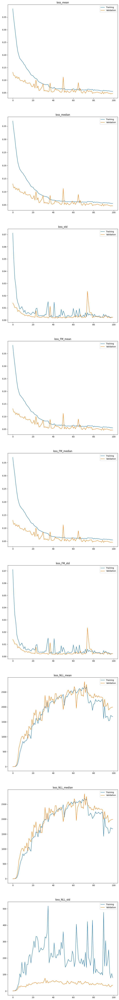

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=261, bias=True)
      (w_2): Linear(in_features=261, out_features=512, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=512, out_features=512, bias=True)
      )
      (linear1): Linear(in_features=512, out_features=1024, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=1024, out_features=512, bias=True)
      (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
  

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:55<00:00,  1.70it/s]


{'loss_mean': 0.04609953239560127,
 'loss_median': 0.04605327546596527,
 'loss_std': 0.002399684628471732,
 'loss_FM_mean': 0.04609953239560127,
 'loss_FM_median': 0.04605327546596527,
 'loss_FM_std': 0.002399684628471732,
 'loss_NLL_mean': 2320.548583984375,
 'loss_NLL_median': 2325.264892578125,
 'loss_NLL_std': 39.87198257446289}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    #device = torch.device("cpu")
    name = "full_model",
    target_device = torch.device("cpu")
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-8,
    rtol = 1e-8,
    sample_only_base_dist = True,
    name = "full_model_no_FM",
    target_device = torch.device("cpu")
)

benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_Laplace_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.Laplace(torch.zeros(x.shape[1]), torch.ones(x.shape[1]) * tau).to_event(1)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
                        "y": y,
                        "sigma_squared": sigma_squared,
                        "beta": beta
                }



In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=1_000)

vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=1_000,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [full_model_no_FM, hmc_sampler, vi],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [41]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<15:35,  9.45s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:39,  9.59s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:28<15:19,  9.48s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:11,  9.50s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:47<15:02,  9.50s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:57<15:00,  9.58s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:06<14:45,  9.52s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:16<14:34,  9.51s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:25<14:24,  9.50s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:35<14:19,  9.56s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:44<14:09,  9.55s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:54<13:56,  9.50s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:03<13:45,  9.49s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:13<13:42,  9.56s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:22<13:30,  9.53s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:32<13:17,  9.50s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:42<13:15,  9.59s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:51<13:08,  9.61s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:01<13:06,  9.70s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:11<13:07,  9.84s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:21<12:59,  9.87s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:31<12:47,  9.83s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:41<12:45,  9.94s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:51<12:39,  9.99s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:02<12:40, 10.14s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:12<12:31, 10.15s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:22<12:18, 10.12s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:32<12:07, 10.11s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:43<12:04, 10.21s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:53<11:50, 10.15s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:02<11:35, 10.08s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:13<11:27, 10.11s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:23<11:21, 10.17s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:33<11:08, 10.14s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:43<10:55, 10.08s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:53<10:51, 10.17s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:03<10:34, 10.07s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:13<10:19,  9.99s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:23<10:14, 10.07s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:34<10:08, 10.15s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:44<09:59, 10.17s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:54<09:48, 10.16s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:04<09:36, 10.12s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:14<09:30, 10.19s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:25<09:21, 10.21s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:35<09:10, 10.19s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:45<08:56, 10.12s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:55<08:51, 10.21s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:05<08:38, 10.16s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:15<08:27, 10.15s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:25<08:18, 10.17s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:35<08:05, 10.11s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:45<07:53, 10.07s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:56<07:43, 10.08s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:06<07:36, 10.14s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:16<07:25, 10.13s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:26<07:15, 10.13s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:36<07:01, 10.03s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:46<06:55, 10.13s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:56<06:41, 10.04s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:06<06:29,  9.99s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:16<06:24, 10.11s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:27<06:15, 10.14s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:37<06:04, 10.12s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:47<05:54, 10.13s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:57<05:46, 10.18s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:07<05:35, 10.17s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:17<05:25, 10.18s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:27<05:14, 10.15s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:38<05:05, 10.19s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:48<04:54, 10.17s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:58<04:44, 10.17s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:08<04:34, 10.16s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [12:19<04:25, 10.22s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:29<04:15, 10.22s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:38<04:01, 10.07s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:49<03:53, 10.14s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:59<03:43, 10.17s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:09<03:33, 10.15s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [13:19<03:23, 10.17s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [13:30<03:14, 10.25s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:40<03:03, 10.17s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:50<02:53, 10.18s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [14:00<02:43, 10.20s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [14:11<02:34, 10.27s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [14:21<02:23, 10.25s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [14:31<02:12, 10.21s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:41<02:02, 10.21s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:52<01:52, 10.26s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [15:02<01:41, 10.18s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [15:12<01:31, 10.15s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [15:22<01:21, 10.20s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [15:32<01:10, 10.13s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [15:42<01:00, 10.09s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:52<00:50, 10.14s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [16:02<00:40, 10.17s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [16:12<00:30, 10.14s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [16:22<00:20, 10.06s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [16:32<00:09, 10.00s/it]

....................


100%|██████████| 100/100 [05:42<00:00,  3.42s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_CST_accuracy,Mean_joint_CST_roc_auc_score,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_CST_accuracy,Std_joint_CST_roc_auc_score,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,full_model,gt,22.540215,0.046120,0.50640,0.50640,-239.667231,0.134184,0.133265,0.001342,0.000021,0.033045,0.033045,391.935071,0.068731,0.065307
1,full_model_no_FM,gt,22.329089,0.046601,0.55445,0.55445,-5433.844890,0.515296,0.515708,0.001510,0.000018,0.036445,0.036445,3042.873765,0.142766,0.141987
2,Hamiltonian Monte Carlo,gt,22.543997,0.046137,0.50315,0.50315,6.069631,0.135033,0.124897,0.004041,0.000071,0.029879,0.029879,4.654976,0.077141,0.068301
3,Variational Inference with guide: AutoDiagonal...,gt,22.526412,0.046063,0.50185,0.50185,-25.599984,0.190689,0.187996,0.002547,0.000035,0.033042,0.033042,66.959063,0.184715,0.183078


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_CST_accuracy_p-value,joint_CST_roc_auc_score_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,full_model,full_model_no_FM,3.896120e-18,3.893923e-18,3.372166e-14,3.375772e-14,3.896560e-18,4.016156e-18,3.896560e-18
1,full_model,Hamiltonian Monte Carlo,5.768590e-12,2.486371e-02,8.262400e-01,7.844722e-01,5.269204e-18,9.862837e-01,2.159076e-04
2,full_model,Variational Inference with guide: AutoDiagonal...,3.896560e-18,8.245185e-17,3.616252e-01,3.522332e-01,1.202861e-13,2.107338e-01,6.376047e-01
3,full_model_no_FM,Hamiltonian Monte Carlo,3.896560e-18,3.895900e-18,1.050632e-14,8.991261e-15,3.896560e-18,4.016156e-18,3.896560e-18
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,3.896120e-18,3.894802e-18,2.040757e-13,1.462702e-13,3.896560e-18,3.471445e-16,2.610314e-16
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,6.180516e-14,8.942702e-01,9.598192e-01,4.471346e-17,3.622131e-01,1.391558e-04



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_CST_accuracy,Mean_CST_roc_auc_score,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_CST_accuracy,Std_CST_roc_auc_score
0,full_model,full_model_no_FM,2.086901,7.397252,0.999445,0.999445,0.610711,0.866330,0.005550,0.005550
1,full_model,Hamiltonian Monte Carlo,0.465046,1.843690,0.989100,0.989100,0.229194,0.335987,0.016798,0.016798
2,full_model,Variational Inference with guide: AutoDiagonal...,0.577290,2.457651,0.984210,0.984210,0.814358,1.545266,0.016918,0.016918
3,full_model_no_FM,Hamiltonian Monte Carlo,2.144925,6.238227,0.999815,0.999815,0.592580,1.039497,0.001705,0.001705
4,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,2.040861,6.801273,0.999870,0.999870,0.591004,0.931734,0.001300,0.001300
5,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.607502,1.144750,0.907220,0.907220,0.782739,1.583643,0.047398,0.047398


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,CST_accuracy_p-value,CST_roc_auc_score_p-value
0,full_model,full_model_no_FM,full_model,Hamiltonian Monte Carlo,1.142369e-33,4.731328e-33,1.078472e-35,1.078472e-35
1,full_model,full_model_no_FM,full_model,Variational Inference with guide: AutoDiagonal...,1.202839e-25,1.401759e-32,5.938396e-28,5.938396e-28
2,full_model,full_model_no_FM,full_model_no_FM,Hamiltonian Monte Carlo,4.823834e-01,1.302334e-28,5.735395e-01,5.735395e-01
3,full_model,full_model_no_FM,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,6.294016e-01,6.361579e-21,1.000000e+00,1.000000e+00
4,full_model,Hamiltonian Monte Carlo,full_model,Variational Inference with guide: AutoDiagonal...,1.456296e-06,5.102212e-01,2.111833e-02,2.118681e-02
5,full_model,Hamiltonian Monte Carlo,full_model_no_FM,Hamiltonian Monte Carlo,7.091892e-34,4.593944e-33,1.359547e-35,1.359547e-35
6,full_model,Hamiltonian Monte Carlo,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,8.469628e-03,2.031144e-17,9.581062e-19,9.476555e-19
7,full_model,Variational Inference with guide: AutoDiagonal...,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,2.809875e-25,2.833030e-30,1.561872e-28,1.561872e-28
8,full_model,Variational Inference with guide: AutoDiagonal...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,4.472369e-02,1.288959e-19,5.080389e-20,5.080064e-20
9,full_model_no_FM,Hamiltonian Monte Carlo,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,2.051921e-01,1.650200e-07,5.656624e-01,5.656624e-01


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                                         full_model  gt   
  1                                   full_model_no_FM  gt   
  2                            Hamiltonian Monte Carlo  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          22.540215            0.046120   
  1                                          22.329089            0.046601   
  2                                          22.543997            0.046137   
  3                                          22.526412            0.046063   
  
     Mean_joint_CST_accuracy  Mean_joint_CST_roc_auc_score  \
  0                  0.50640                       0.50640   
  1                  0.55445                       0.55445   
  2                  0.50315                       0.50315   
  3 

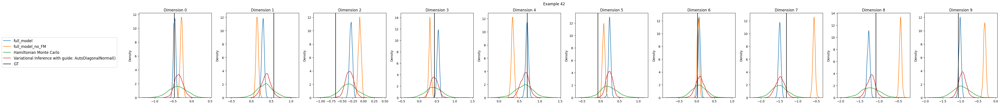

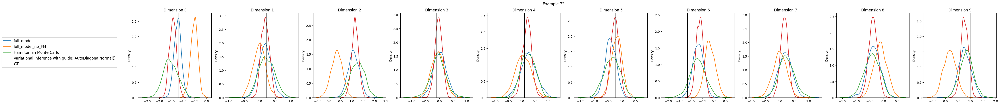

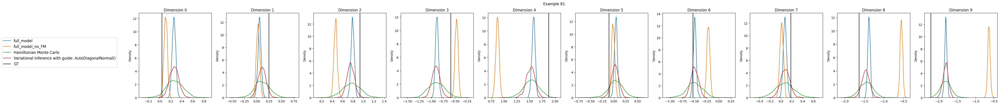

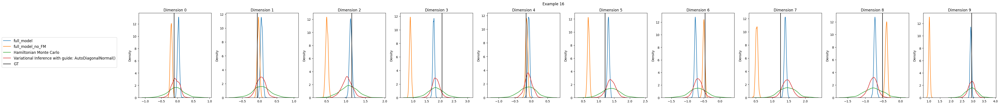

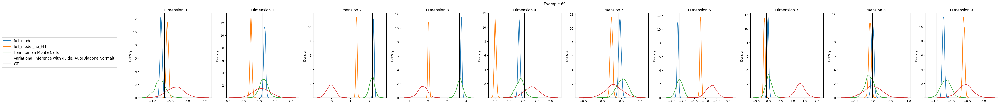

In [42]:
evaluation.plot_results()